# 04: Izbor parametara po algoritmima

Dijagnostike izbora parametara po algoritmu — revizija reprezentacije, skan za izbor k, predstavnici na sopstvenom najboljem k — i isto za sloj rečenica. Sekcija 6 donosi reviziju ne-k parametara (tabela se upisuje u csv/param_scan_documents.csv), a sekcija 7 poređenje sa sirovim TF-IDF prolazom.


In [11]:
import os, sys, time, warnings
if os.path.exists("vocabs.txt"):
    ROOT = os.getcwd()
elif os.path.exists("../vocabs.txt"):
    ROOT = os.path.abspath("..")
else:
    raise FileNotFoundError("Nije pronadjen path")
os.chdir(ROOT); sys.path.insert(0, ROOT)
print("ROOT =", ROOT)
os.makedirs("csv", exist_ok=True)
%matplotlib inline
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import (fcluster, linkage, dendrogram)
from scipy.spatial.distance import pdist, squareform
from scipy.sparse import issparse
from sklearn.manifold import TSNE
from sklearn.metrics import (adjusted_rand_score, silhouette_score,
                             davies_bouldin_score,
                             calinski_harabasz_score)
from sklearn.cluster import (KMeans, BisectingKMeans, Birch,
                             AgglomerativeClustering, DBSCAN,
                             SpectralClustering)
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import TruncatedSVD, NMF
from sklearn.preprocessing import normalize
from sklearn.feature_extraction.text import TfidfVectorizer

import nbformat


def _load_tools(nb_path, label):
    nbx = nbformat.read(nb_path, as_version=4)
    n = 0
    for _c in nbx.cells:
        if _c.cell_type == "code" and _c.metadata.get("tools"):
            exec(compile(_c.source, label, "exec"), globals())
            n += 1
    return n


_p1 = next((p for p in ("notebooks/01_preprocessing.ipynb",
                        "01_preprocessing.ipynb") if os.path.exists(p)))
_p2 = next((p for p in ("notebooks/02_clustering.ipynb",
                        "02_clustering.ipynb") if os.path.exists(p)))
print("alati iz 01:", _load_tools(_p1, "<01_alati>"))
print("alati iz 02:", _load_tools(_p2, "<02_alati>"))
print("K_MAIN =", K_MAIN)

_potrebni = ("doc_features_scan.pkl", "tsne_docs.pkl",
             "hierarchy_docs.pkl", "sent_features.pkl",
             "sent_dim_scan.pkl", "tsne_sent_sample.pkl")
_fale = [p for p in _potrebni
         if not os.path.exists(os.path.join("results", p))]
if _fale:
    raise FileNotFoundError(
        "Nedostaju keševi iz 02_clustering.ipynb: " + ", ".join(_fale)
        + "\n-> prvo pokreni 02_clustering.ipynb od početka do kraja, "
          "pa onda ovu svesku.")

F = joblib.load("results/doc_features_scan.pkl")
tfidf, red, Y = F["tfidf"], F["red"], F["Y"]
emb_tsne = joblib.load("results/tsne_docs.pkl")
emb2 = red[:, :2]
print("tfidf", tfidf.shape, "| red", red.shape,
      "| tsne", emb_tsne.shape)


def inertia_of(labels, X):
    lab = np.asarray(labels)
    total = 0.0
    for c in set(lab.tolist()) - {-1}:
        m = lab == c
        centroid = X[m].mean(0)
        total += float(((X[m] - centroid) ** 2).sum())
    return total


def bestk_stamps(labels, k, Fd, n_words=2):
    lab = np.asarray(labels)
    if k > 20:
        return label_stamps(Fd, lab, n_words=n_words)
    m_lab = min(max(1, round(20 / k)), 5)
    Yx = Fd["Y"]
    out = {}
    for c in sorted(set(lab.tolist()) - {-1}):
        idx = np.where(lab == c)[0]
        if len(idx) < 30:
            out[c] = (f"(mali, n={len(idx)})", -1)
            continue
        lift_c = _class_lift(Yx, lab == c)
        ok = np.isfinite(lift_c) & (lift_c >= 1.0)
        prev = Yx[idx].sum(0) / len(idx)
        ok &= prev >= 0.05
        order = np.argsort(-np.where(ok, lift_c, -np.inf))
        cls = [f"{CLASS_NAMES[i]} {lift_c[i]:.1f}"
               for i in order[:m_lab] if ok[i]]
        words = discriminative_words(Fd["tfidf"], Fd["terms"], idx,
                                     Fd["gmean"], n=n_words)
        name = "\n".join(cls) if cls else "(mixed)"
        out[c] = (f"{name}\n{'/'.join(words)}",
                  int(order[0]) if ok.any() else -1)
    return out


def bestk_words_table(labels, k, Fd, name, n_words=6):
    lab = np.asarray(labels)
    m_lab = min(max(1, round(20 / k)), 5)
    Yx = Fd["Y"]
    rows = []
    for c in sorted(set(lab.tolist()) - {-1}):
        idx = np.where(lab == c)[0]
        if len(idx) < 30:
            continue
        lift_c = _class_lift(Yx, lab == c)
        prev = Yx[idx].sum(0) / len(idx)
        ok = np.isfinite(lift_c) & (lift_c >= 1.0) & (prev >= 0.05)
        order = np.argsort(-np.where(ok, lift_c, -np.inf))
        cls = [f"{CLASS_NAMES[i]} x{lift_c[i]:.1f}"
               for i in order[:m_lab] if ok[i]]
        words = discriminative_words(Fd["tfidf"], Fd["terms"], idx,
                                     Fd["gmean"], n=n_words)
        rows.append(dict(cluster=c, n=len(idx),
                         classes=", ".join(cls),
                         words=", ".join(words)))
    df = pd.DataFrame(rows)
    df.to_csv(f"csv/bestk_{_safe_filename(name)}_words.csv", index=False)
    print(f"\n--- {name} (k={k}): klaster -> klase (lift) + reči ---")
    print(df.to_string(index=False))

ROOT = C:\Users\Trile\PycharmProjects\PythonProject3\important!
alati iz 01: 3
alati iz 02: 26
K_MAIN = 20
tfidf (12234, 8167) | red (12234, 100) | tsne (12234, 2)


## 1. Reprezentacija: čistoća po dimenziji + lakat varijanse


  [keš] param_choice_reps.pkl učitan (obriši za ponovni račun)
  [keš] param_choice_kmeans_dim.pkl učitan (obriši za ponovni račun)
 dim   mean    std  explained_var
  50 0.5213 0.0032          0.118
 100 0.5265 0.0109          0.172
 150 0.5158 0.0147          0.216
 200 0.5131 0.0095          0.254
 300 0.5180 0.0087          0.320
 500 0.5229 0.0095          0.423
  [keš] param_choice_ev500.pkl učitan (obriši za ponovni račun)


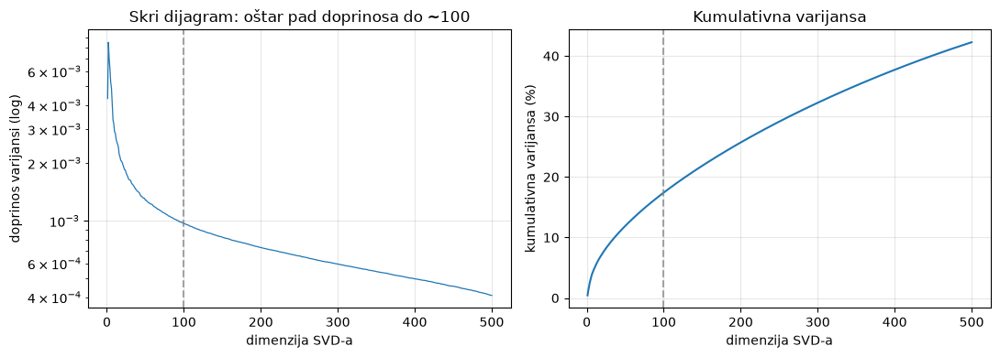

In [12]:
DIMS = (50, 100, 150, 200, 300, 500)
SEEDS = (42, 7, 2026)

def _rep_fits():
    out = {}
    for d in DIMS:
        svd = TruncatedSVD(d, random_state=42).fit(tfidf)
        out[d] = dict(red=normalize(svd.transform(tfidf), norm="l2"),
                      evr=float(svd.explained_variance_ratio_.sum()))
        log(f"  SVD({d}) fit; varijansa {out[d]['evr']:.3f}")
    return out

REPS = cached("param_choice_reps.pkl", _rep_fits)

def _kmeans_by_dim():
    rows = []
    for d in DIMS:
        R = REPS[d]["red"]
        for seed in SEEDS:
            km = KMeans(K_MAIN, random_state=seed, n_init=10).fit(R)
            rows.append(dict(dim=d, seed=seed,
                             purity=multilabel_purity(km.labels_, Y)))
    return rows

rows = cached("param_choice_kmeans_dim.pkl", _kmeans_by_dim)
km_dim = (pd.DataFrame(rows)
          .groupby("dim").purity.agg(["mean", "std"]).reset_index())
km_dim["explained_var"] = [round(REPS[d]["evr"], 3) for d in km_dim.dim]
km_dim.to_csv("csv/rep_scan_kmeans_ext.csv", index=False)
print(km_dim.round(4).to_string(index=False))

ev500 = cached("param_choice_ev500.pkl", lambda:
              TruncatedSVD(500, random_state=42).fit(tfidf)
              .explained_variance_ratio_.cumsum())
xs = np.arange(1, 501)
marg = np.diff(np.concatenate([[0.0], ev500]))
fig, axes = plt.subplots(1, 2, figsize=(11, 4))
axes[0].plot(xs, marg, lw=0.9)
axes[0].axvline(100, color="gray", ls="--", alpha=0.7)
axes[0].set_yscale("log")
axes[0].set_xlabel("dimenzija SVD-a")
axes[0].set_ylabel("doprinos varijansi (log)")
axes[0].set_title("Skri dijagram: o\u0161tar pad doprinosa do ~100")
axes[1].plot(xs, ev500 * 100, lw=1.5)
axes[1].axvline(100, color="gray", ls="--", alpha=0.7)
axes[1].set_xlabel("dimenzija SVD-a")
axes[1].set_ylabel("kumulativna varijansa (%)")
axes[1].set_title("Kumulativna varijansa")
for ax in axes:
    ax.grid(alpha=0.3)
fig.tight_layout()
show_fig("rep_explained_var.png")

## 2. Skan za izbor $k$ po algoritmu


[23:29:36] skan: Bisecting K-Means ...
  [keš] param_choice_batt_bisecting_k-means.pkl učitan (obriši za ponovni račun)


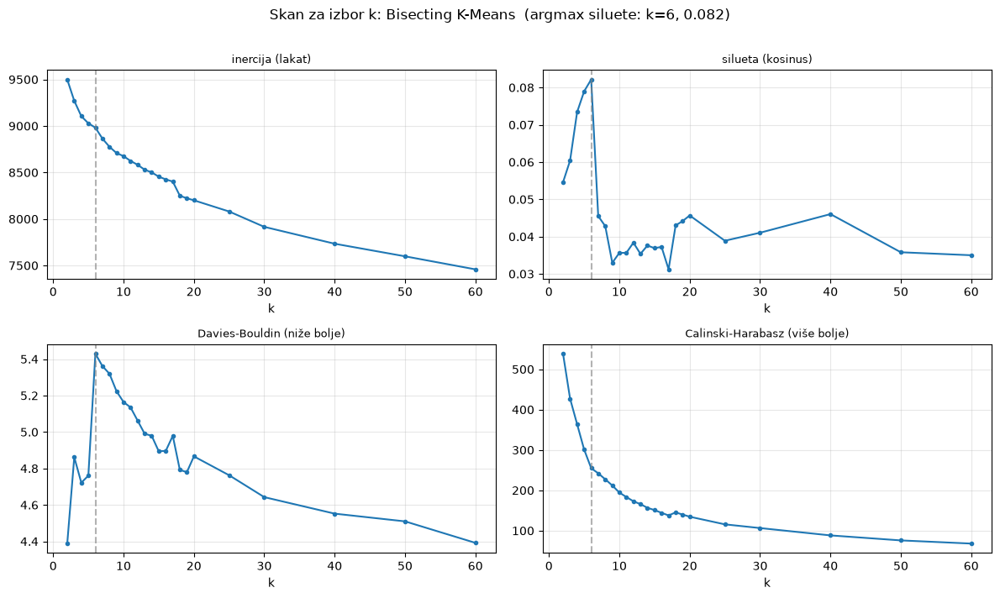

Bisecting K-Means: argmax siluete k=6 (0.08215427490536514)
[23:31:42] skan: Agglomerative (ward) ...
  [keš] param_choice_batt_agglomerative_ward.pkl učitan (obriši za ponovni račun)


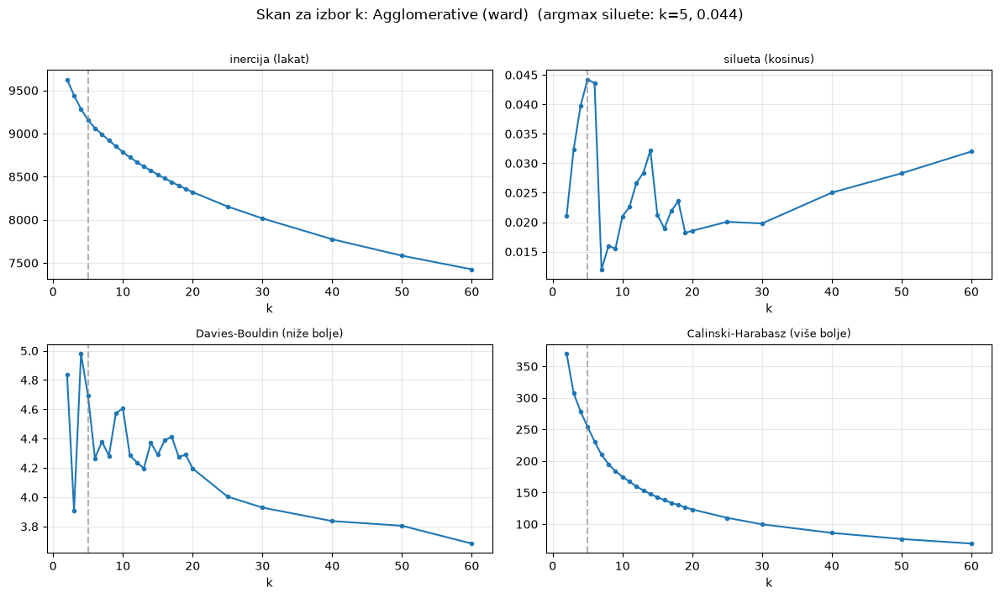

Agglomerative (ward): argmax siluete k=5 (0.04422635037359266)
[23:33:31] skan: GMM (diag) ...
  [keš] param_choice_batt_gmm_diag.pkl učitan (obriši za ponovni račun)


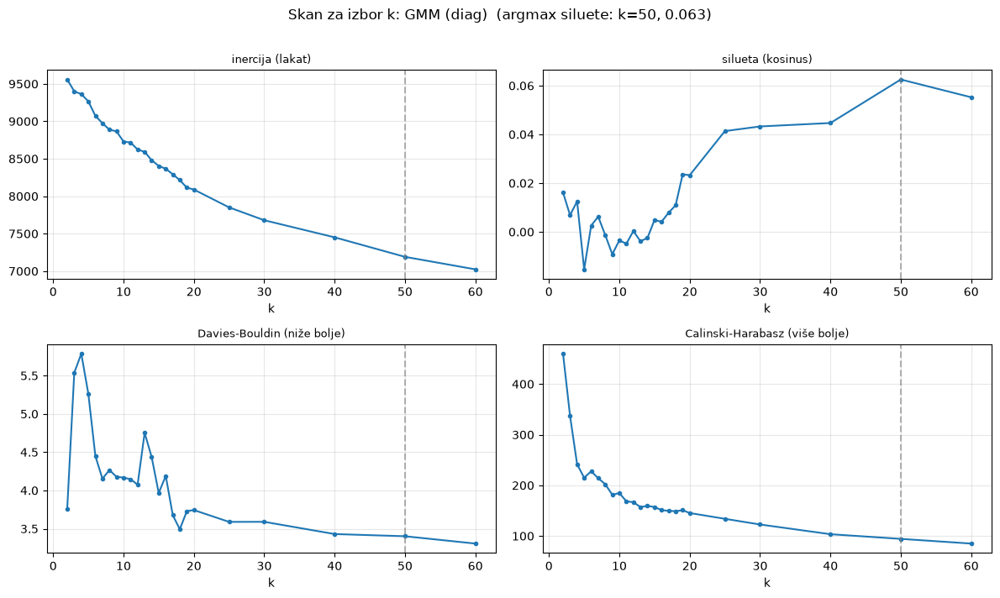

GMM (diag): argmax siluete k=50 (0.06253538166983327)
[23:35:35] skan: NMF ...
  [keš] param_choice_batt_nmf.pkl učitan (obriši za ponovni račun)


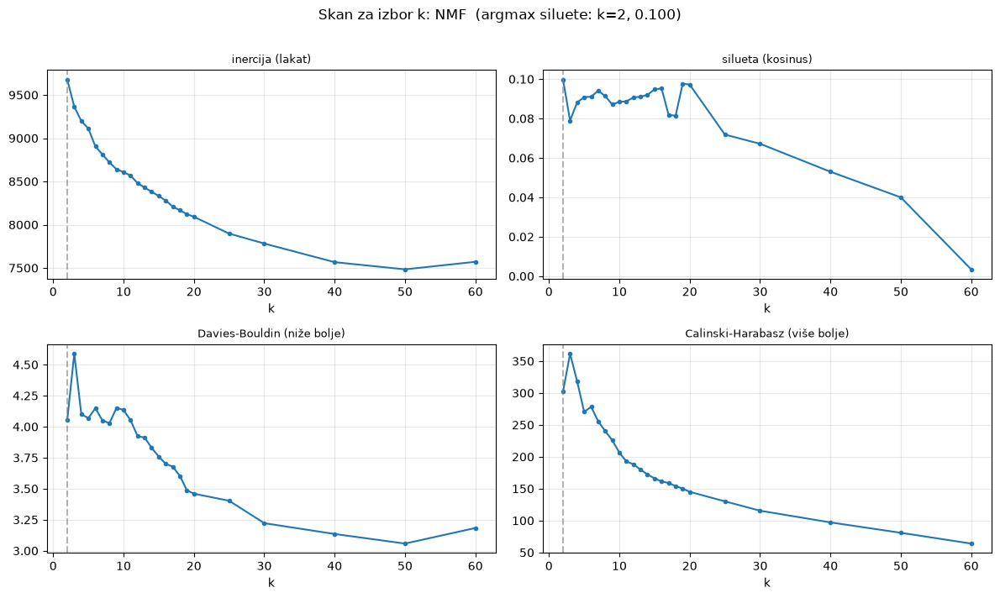

NMF: argmax siluete k=2 (0.09980590802245703)
[23:37:37] skan: Spectral (k-NN) ...
  [keš] param_choice_batt_spectral_k-nn.pkl učitan (obriši za ponovni račun)


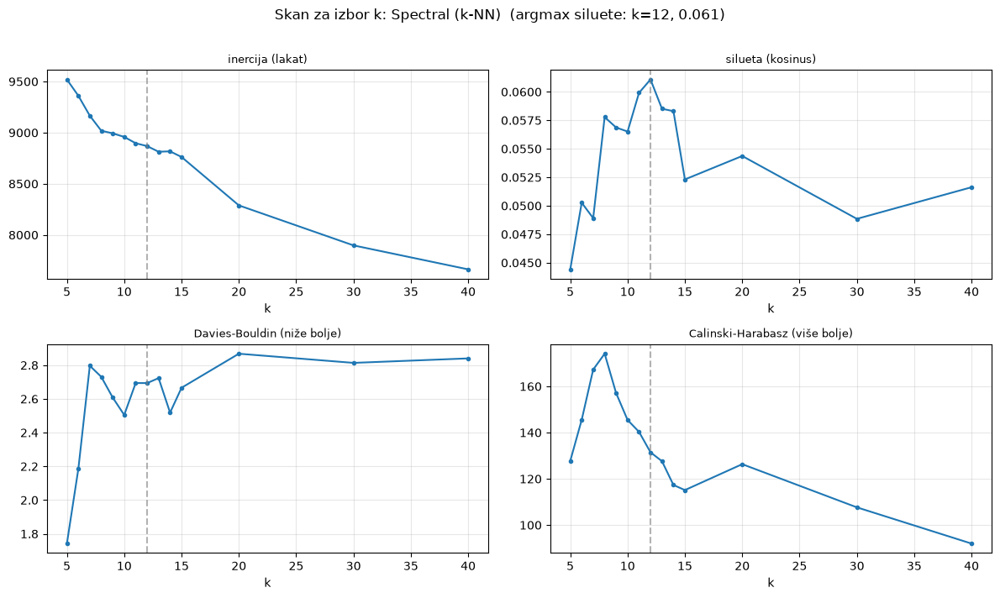

Spectral (k-NN): argmax siluete k=12 (0.06108287403165864)
[23:38:54] skan: BIRCH ...
  [keš] param_choice_batt_birch.pkl učitan (obriši za ponovni račun)


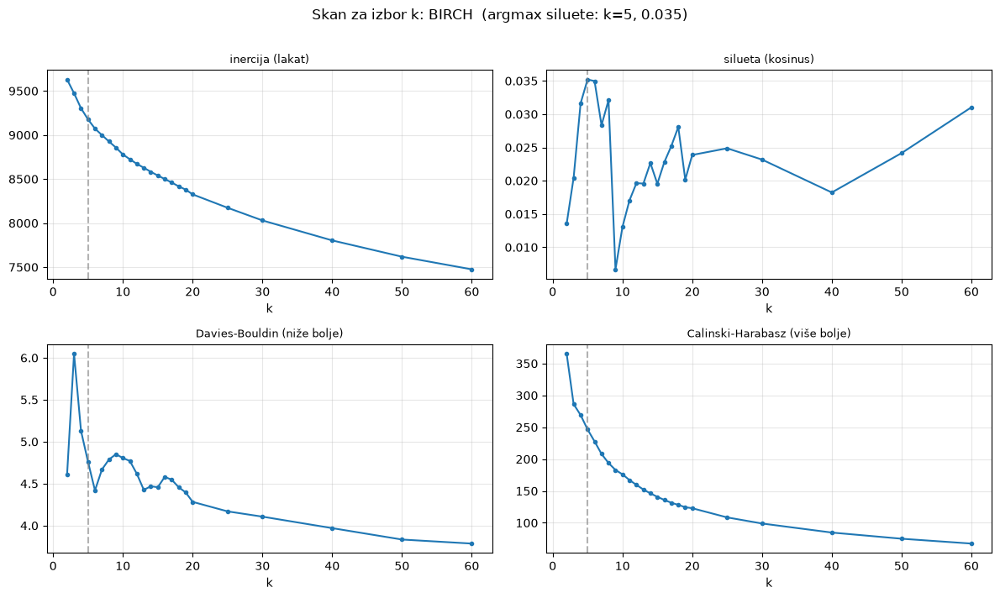

BIRCH: argmax siluete k=5 (0.035210530610648584)


In [13]:
GRID = list(range(2, 21)) + [25, 30, 40, 50, 60]
SPEC_GRID = [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 20, 30, 40]


from sklearn import config_context


def skan(name, labels_by_k, X, fname=None):
    rows = []
    for k, lab in labels_by_k.items():
        with config_context(working_memory=128):
            m = internal_metrics(X, lab)
        rows.append(dict(k=k, sil=m["silhouette"], db=m["davies_bouldin"],
                         ch=m["calinski"],
                         inertia=round(inertia_of(lab, X), 1)))
    df = pd.DataFrame(rows)
    fname = fname or f"skan_{_safe_filename(name)}"
    df.to_csv(f"csv/{fname}.csv", index=False)
    fig, axes = plt.subplots(2, 2, figsize=(12, 7))
    best = df.loc[df.sil.idxmax()]
    for ax, col, t in zip(axes.ravel(),
                          ("inertia", "sil", "db", "ch"),
                          ("inercija (lakat)", "silueta (kosinus)",
                           "Davies-Bouldin (niže bolje)",
                           "Calinski-Harabasz (više bolje)")):
        ax.plot(df.k, df[col], marker="o", ms=3)
        ax.axvline(int(best.k), color="gray", ls="--", alpha=0.6)
        ax.set_title(t, fontsize=9); ax.set_xlabel("k")
        ax.grid(alpha=0.3)
    fig.suptitle(f"Skan za izbor k: {name}  "
                 f"(argmax siluete: k={int(best.k)}, {best.sil:.3f})",
                 y=1.01)
    fig.tight_layout()
    show_fig(f"{fname}.png")
    print(f"{name}: argmax siluete k={int(best.k)} ({best.sil})")
    return df


def fit_labels(name, X, Tfidf):
    out = {}
    if name == "K-Means":
        for k in GRID:
            out[k] = KMeans(k, random_state=42, n_init=10) \
                .fit(X).labels_
    elif name == "Bisecting K-Means":
        for k in GRID:
            out[k] = BisectingKMeans(k, random_state=42).fit(X).labels_
    elif name == "Agglomerative (ward)":
        def _tree():
            return linkage(pdist(X), method="ward")
        Z = cached("param_choice_ward_tree.pkl", _tree)
        for k in GRID:
            out[k] = fcluster(Z, t=k, criterion="maxclust")
    elif name == "GMM (diag)":
        for k in GRID:
            out[k] = GaussianMixture(
                k, covariance_type="diag", random_state=42
            ).fit(X).predict(X)
    elif name == "NMF":
        for k in GRID:
            out[k] = NMF(k, random_state=42, init="nndsvda",
                         max_iter=300).fit(Tfidf) \
                .transform(Tfidf).argmax(1)
    elif name == "Spectral (k-NN)":
        for k in SPEC_GRID:
            out[k] = SpectralClustering(
                k, affinity="nearest_neighbors", n_neighbors=30,
                random_state=42, n_jobs=-1).fit(X).labels_
    elif name == "BIRCH":
        for k in GRID:
            out[k] = Birch(n_clusters=k, threshold=0.3).fit(X).labels_
    return out


SKANS = {}
for name in ("Bisecting K-Means", "Agglomerative (ward)",
             "GMM (diag)", "NMF", "Spectral (k-NN)", "BIRCH"):
    log(f"skan: {name} ...")
    labs = cached(f"param_choice_batt_{_safe_filename(name)}.pkl",
                  lambda n=name: fit_labels(n, red, tfidf))
    SKANS[name] = skan(name, labs, red)

## 3. Predstavnici na sopstvenom najboljem $k$


  [keš] param_choice_bestk_labels.pkl učitan (obriši za ponovni račun)
[23:41:04] K-Means: k=72, čistoća 0.5660, silueta 0.09495671594176003
  [pkl] results\bestk_k-means.pkl


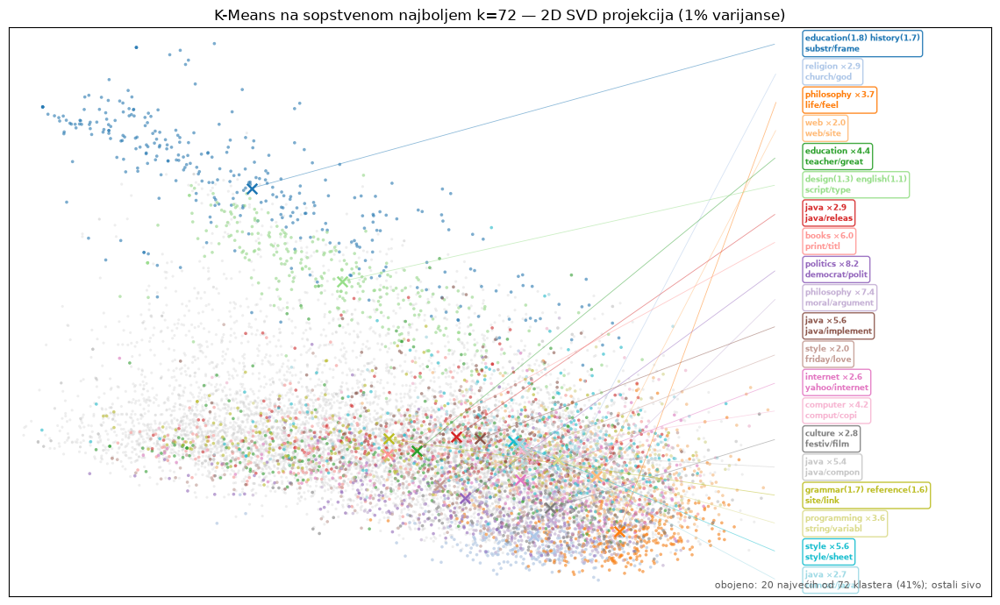

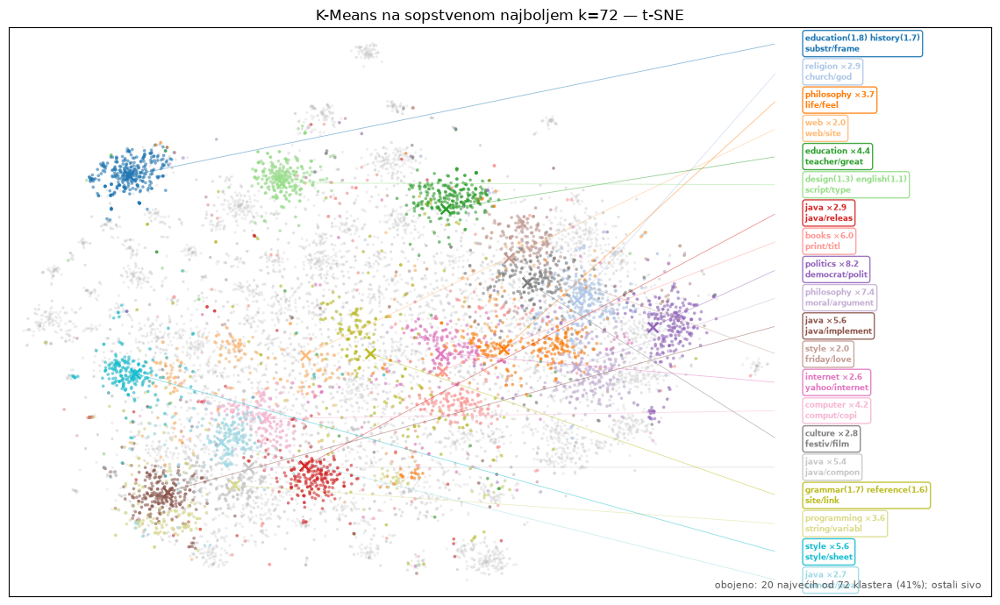

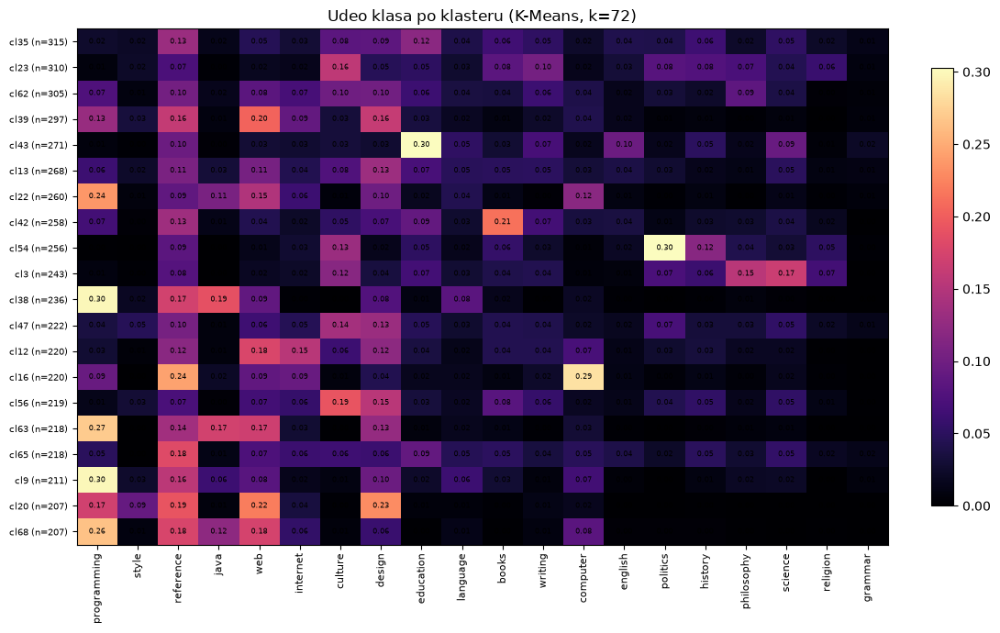

[23:41:30] Bisecting K-Means: k=5, čistoća 0.4295, silueta 0.07897371036962572
  [pkl] results\bestk_bisecting_k-means.pkl


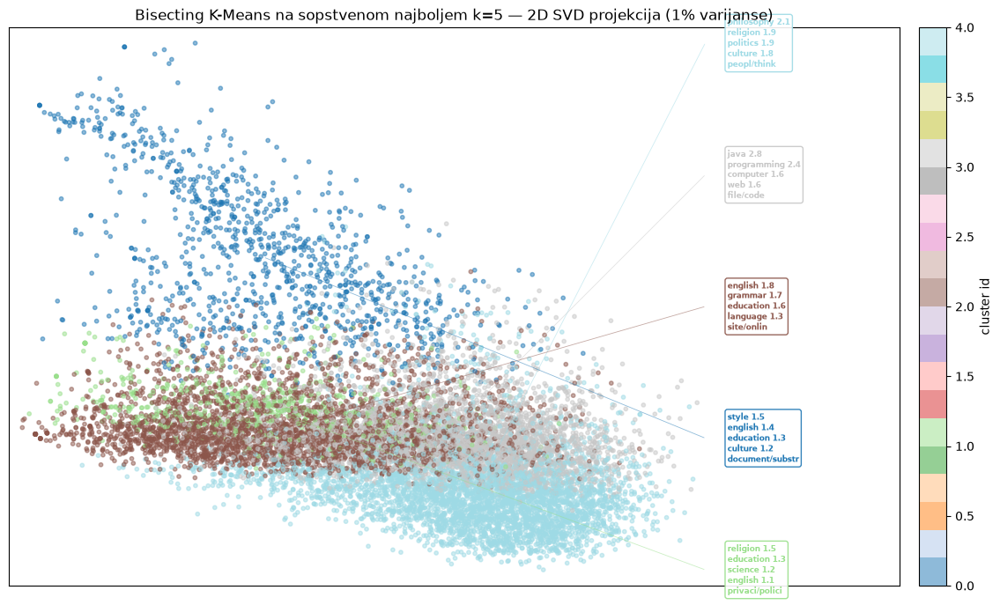

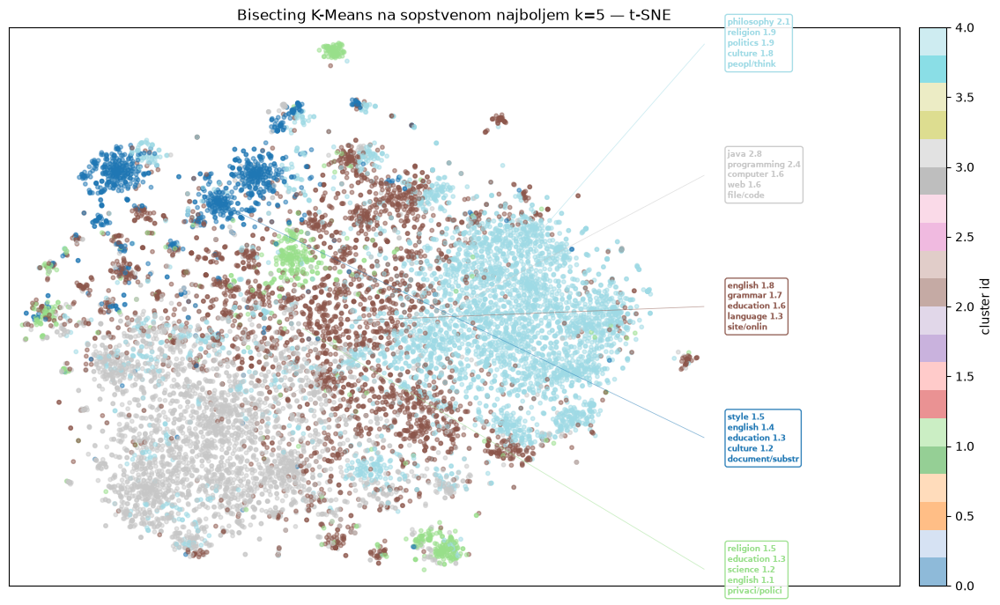

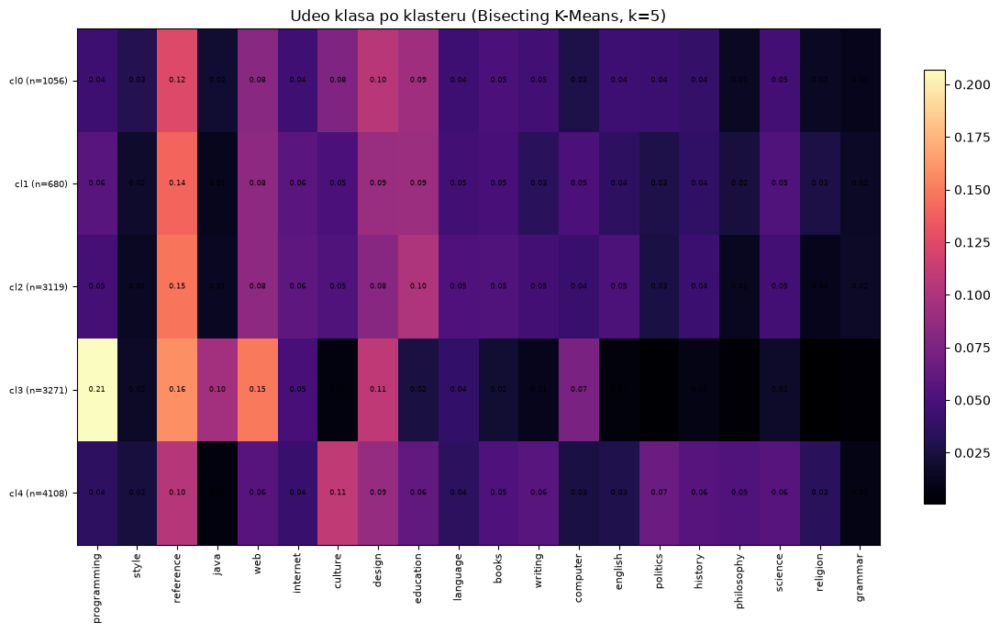


--- Bisecting K-Means (k=5): klaster -> klase (lift) + reči ---
 cluster    n                                                     classes                                          words
       0 1056      style x1.5, english x1.4, education x1.3, culture x1.2 document, substr, frame, script, write, parent
       1  680   religion x1.5, education x1.3, science x1.2, english x1.1     privaci, polici, flash, term, skin, player
       2 3119   english x1.8, grammar x1.7, education x1.6, language x1.3    site, onlin, copyright, search, pleas, free
       3 3271        java x2.8, programming x2.4, computer x1.6, web x1.6         file, code, applic, java, instal, user
       4 4108 philosophy x2.1, religion x1.9, politics x1.9, culture x1.8          peopl, think, thing, year, time, know
[23:41:48] Agglomerative (ward): k=5, čistoća 0.4256, silueta 0.04422635037359266
  [pkl] results\bestk_agglomerative_ward.pkl


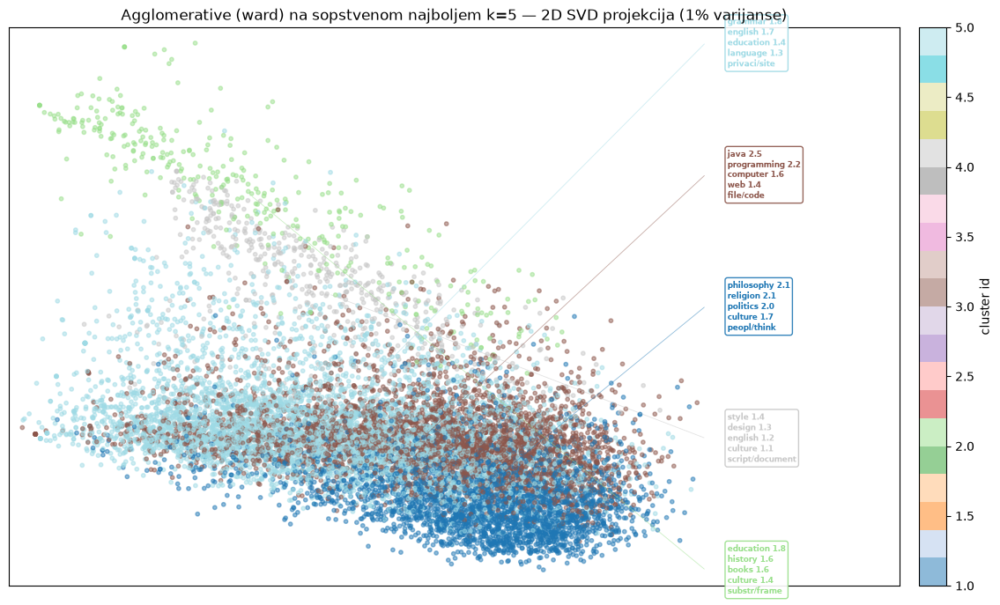

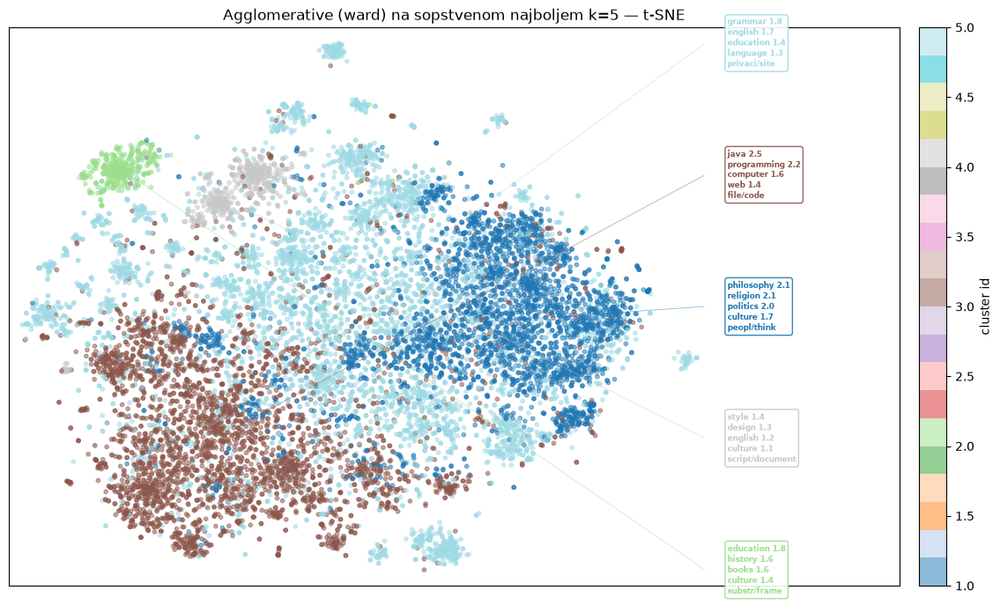

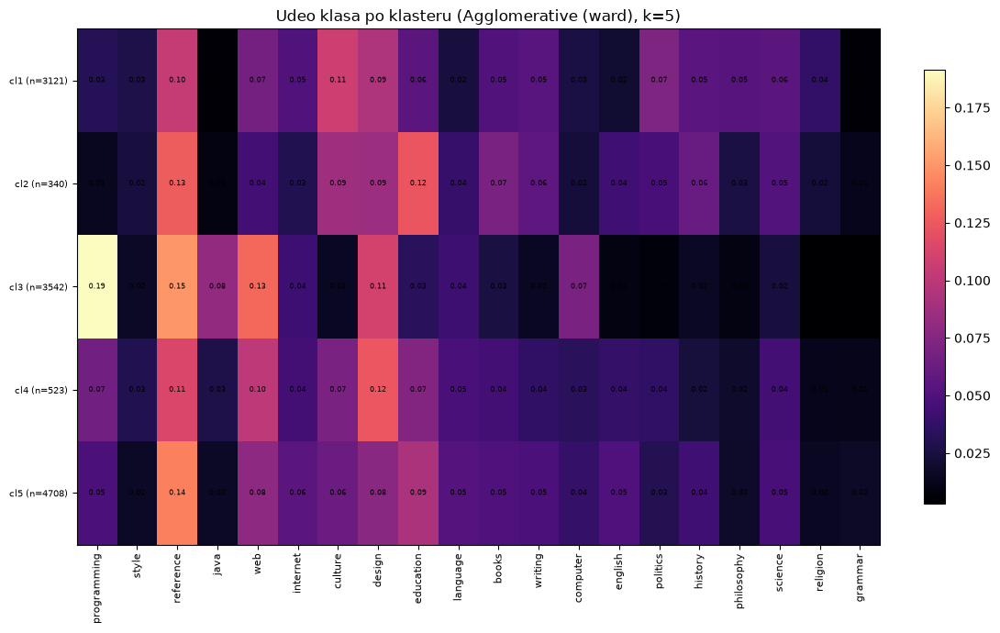


--- Agglomerative (ward) (k=5): klaster -> klase (lift) + reči ---
 cluster    n                                                     classes                                           words
       1 3121 philosophy x2.1, religion x2.1, politics x2.0, culture x1.7           peopl, think, thing, post, year, good
       2  340      education x1.8, history x1.6, books x1.6, culture x1.4  substr, frame, parent, length, document, event
       3 3542        java x2.5, programming x2.2, computer x1.6, web x1.4      file, code, java, applic, download, instal
       4  523         style x1.4, design x1.3, english x1.2, culture x1.1        script, document, type, text, com, write
       5 4708   grammar x1.8, english x1.7, education x1.4, language x1.3 privaci, site, flash, polici, search, copyright
[23:42:03] GMM (diag): k=50, čistoća 0.5423, silueta 0.06253538166983327
  [pkl] results\bestk_gmm_diag.pkl


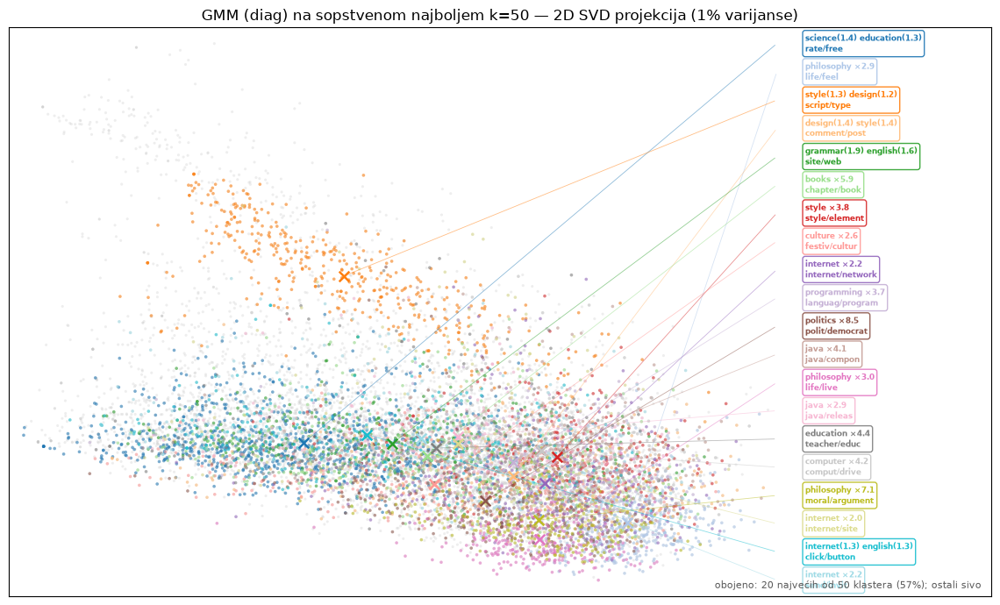

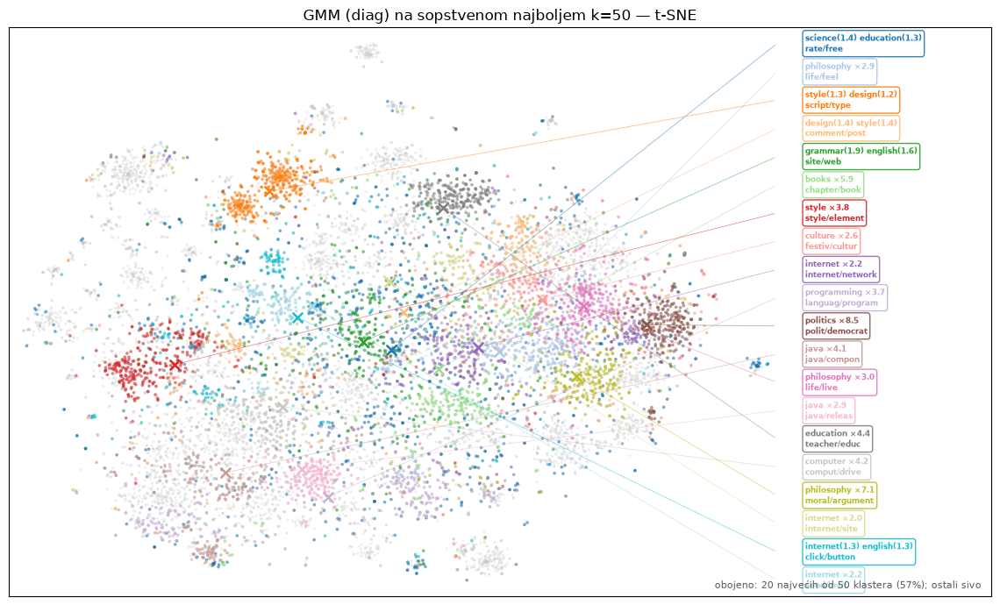

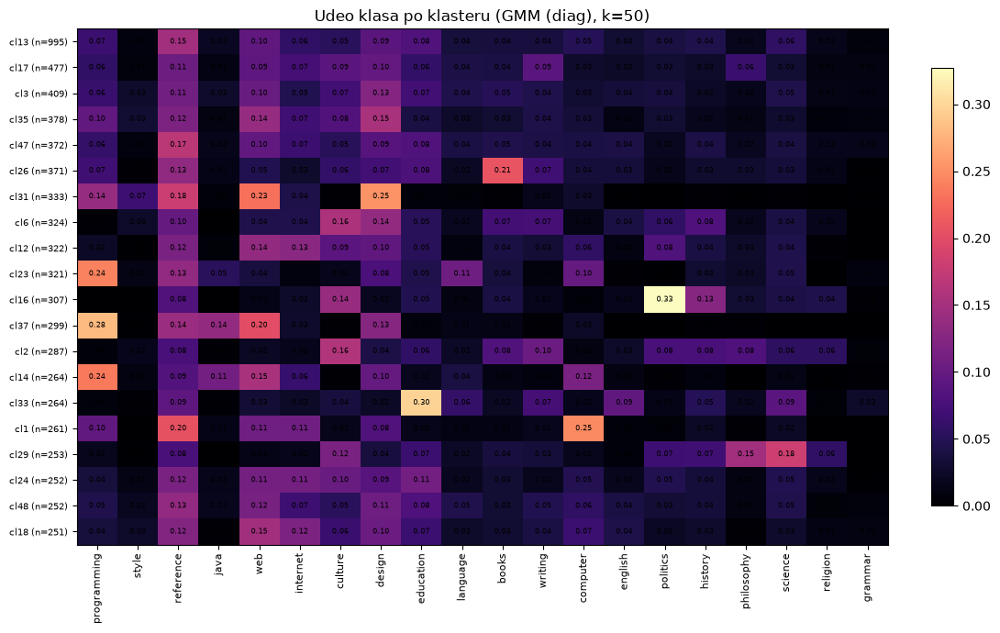

[23:42:28] Spectral (k-NN): k=12, čistoća 0.4331, silueta 0.06108287403165864
  [pkl] results\bestk_spectral_k-nn.pkl


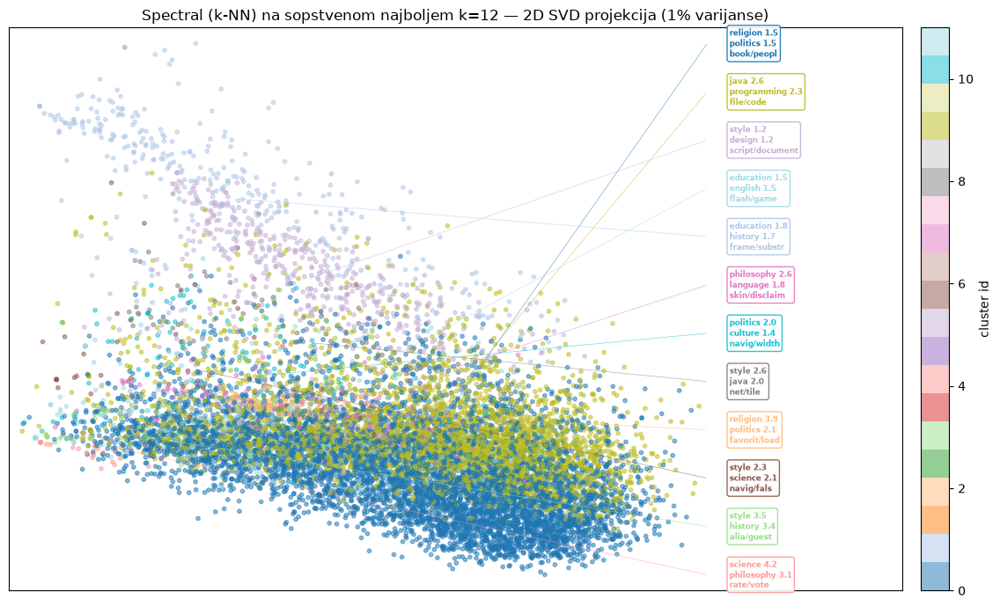

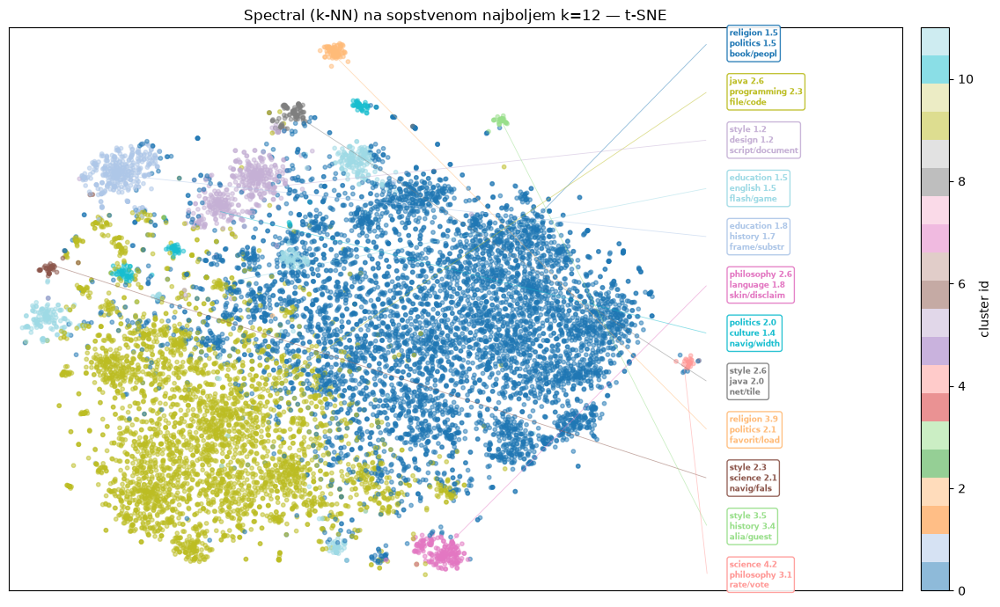

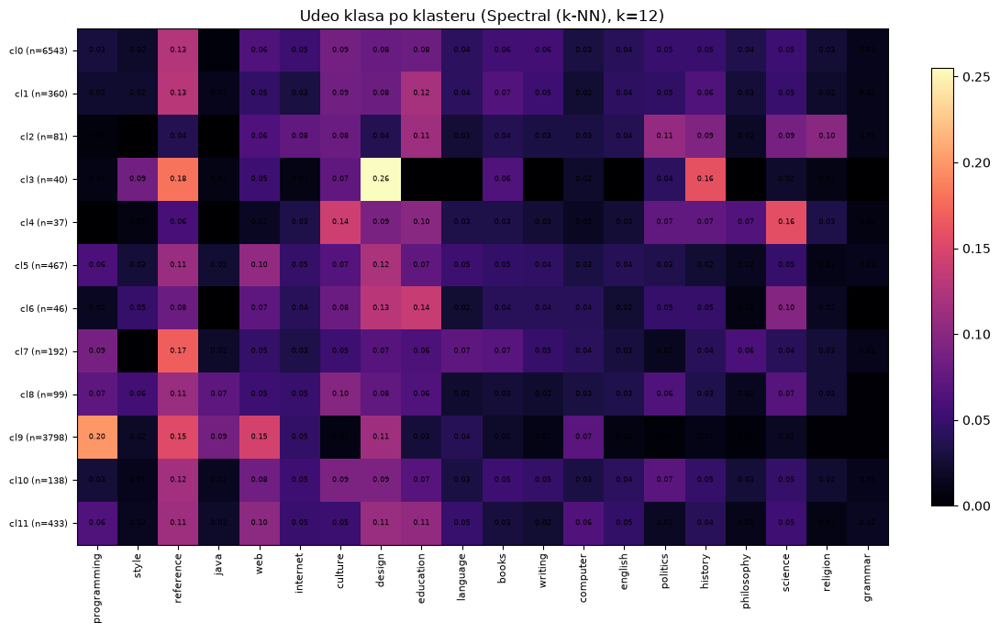


--- Spectral (k-NN) (k=12): klaster -> klase (lift) + reči ---
 cluster    n                        classes                                             words
       0 6543   religion x1.5, politics x1.5          book, peopl, year, stori, student, think
       1  360   education x1.8, history x1.7 frame, substr, parent, length, document, function
       2   81   religion x3.9, politics x2.1         favorit, load, pend, comment, spam, video
       3   40       style x3.5, history x3.4            alia, guest, photo, valu, pass, anytim
       4   37  science x4.2, philosophy x3.1               rate, vote, word, talk, choos, view
       5  467        style x1.2, design x1.2          script, document, type, text, com, write
       6   46       style x2.3, science x2.1         navig, fals, shockwav, split, flash, true
       7  192 philosophy x2.6, language x1.8         skin, disclaim, import, regist, main, gnu
       8   99          style x2.6, java x2.0                 net, tile, navig, bl

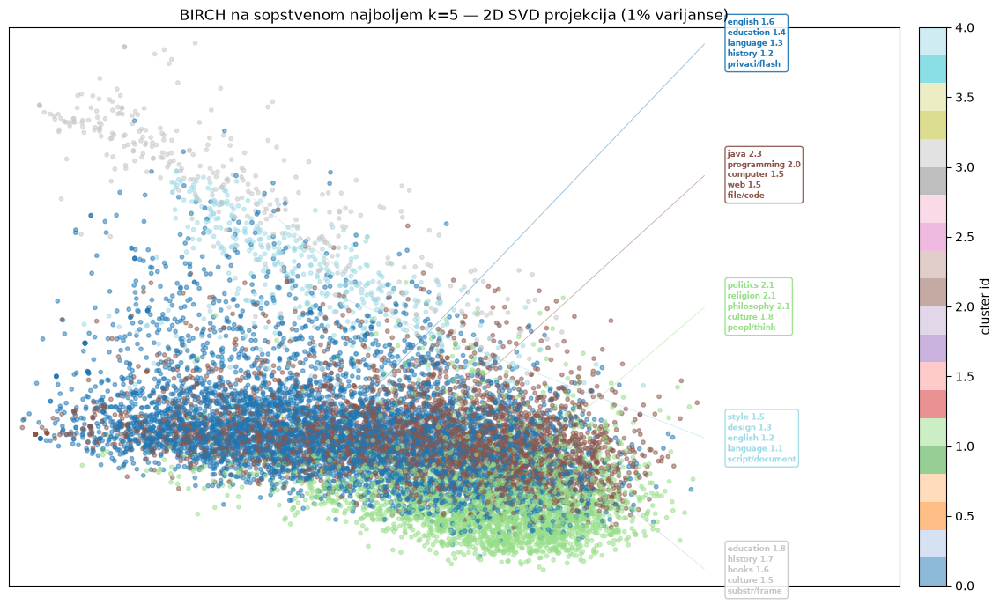

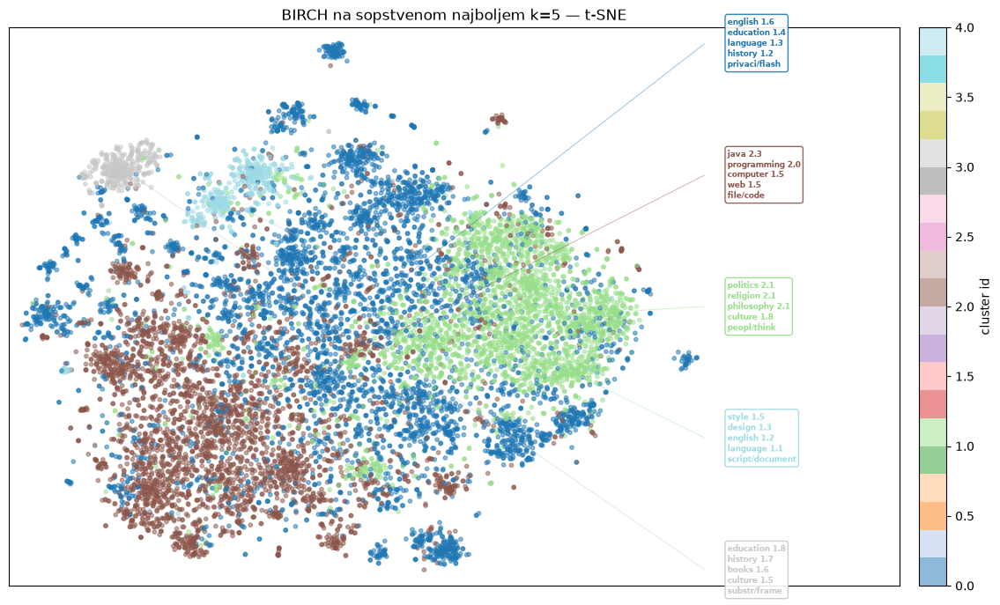

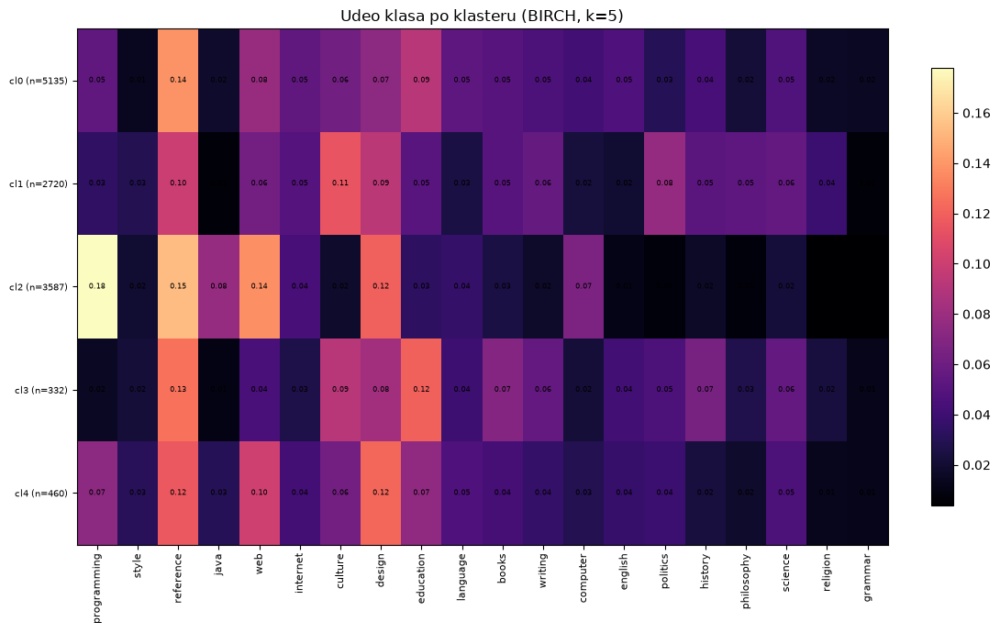


--- BIRCH (k=5): klaster -> klase (lift) + reči ---
 cluster    n                                                     classes                                          words
       0 5135   english x1.6, education x1.4, language x1.3, history x1.2  privaci, flash, polici, site, english, search
       1 2720 politics x2.1, religion x2.1, philosophy x2.1, culture x1.8          peopl, think, post, thing, year, time
       2 3587        java x2.3, programming x2.0, computer x1.5, web x1.5     file, code, applic, java, instal, download
       3  332      education x1.8, history x1.7, books x1.6, culture x1.5 substr, frame, parent, length, document, event
       4  460        style x1.5, design x1.3, english x1.2, language x1.1       script, document, type, text, com, write
[23:43:11] NMF: k=2, čistoća 0.3874, silueta 0.09980590802245703
  [pkl] results\bestk_nmf.pkl


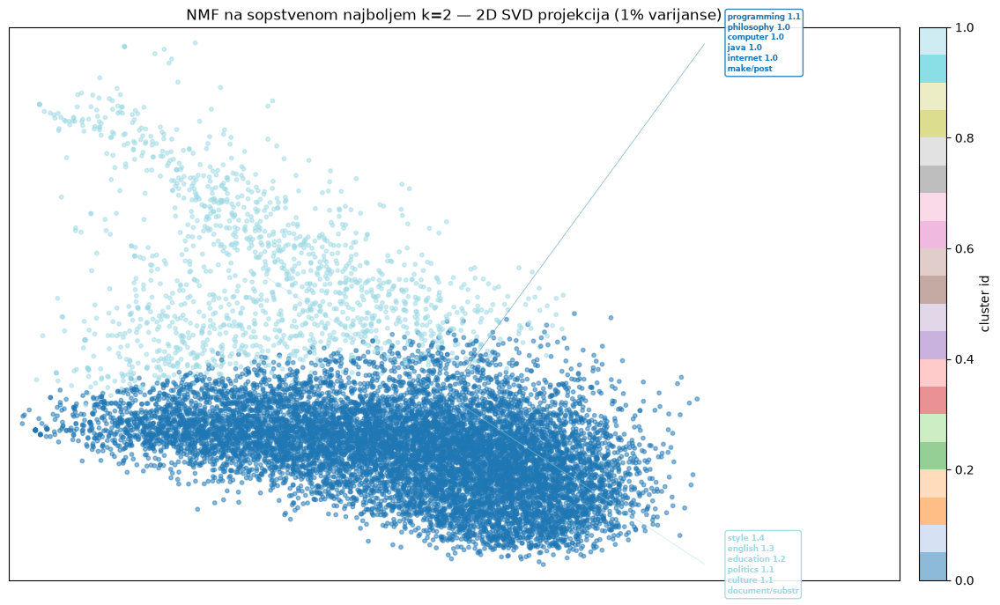

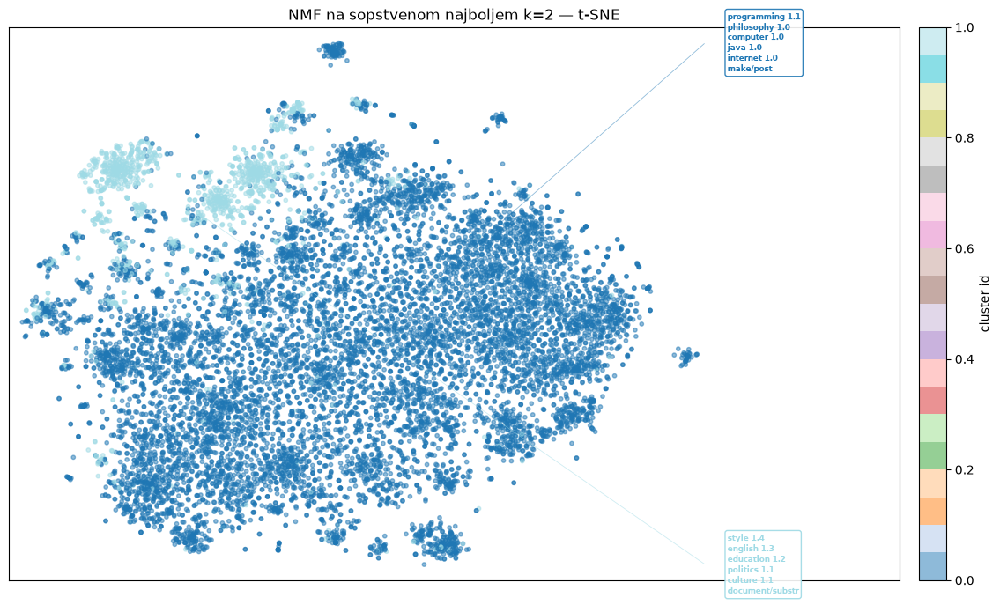

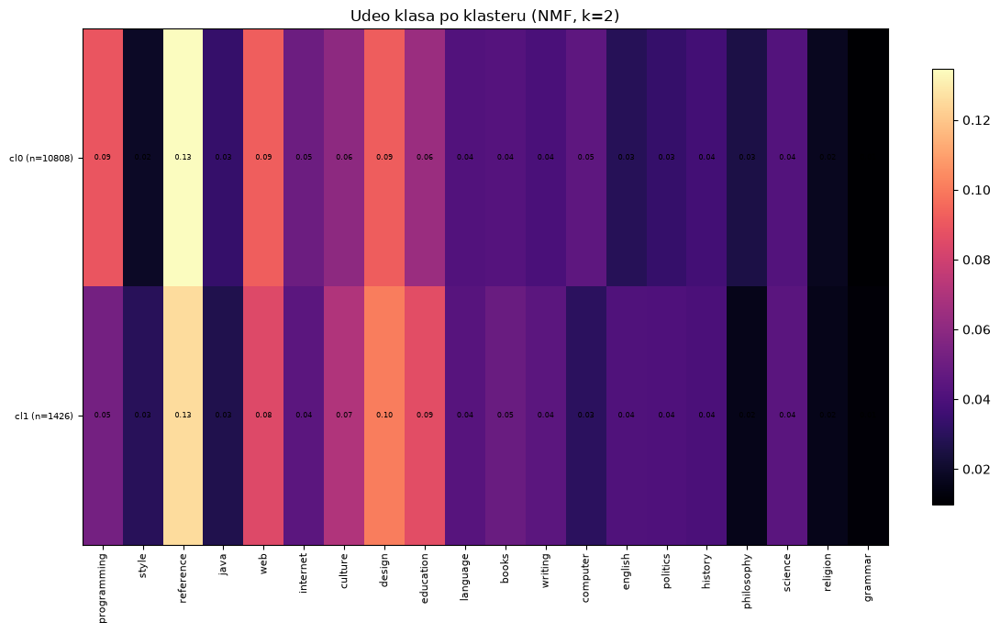


--- NMF (k=2): klaster -> klase (lift) + reči ---
 cluster     n                                                                    classes                                          words
       0 10808 programming x1.1, philosophy x1.0, computer x1.0, java x1.0, internet x1.0             make, post, work, time, want, veri
       1  1426      style x1.4, english x1.3, education x1.2, politics x1.1, culture x1.1 document, substr, frame, script, parent, write
           algorithm  k_best  silhouette  purity
             K-Means      72    0.094957  0.5660
   Bisecting K-Means       5    0.078974  0.4295
Agglomerative (ward)       5    0.044226  0.4256
          GMM (diag)      50    0.062535  0.5423
     Spectral (k-NN)      12    0.061083  0.4331
               BIRCH       5    0.035211  0.4172
                 NMF       2    0.099806  0.3874


In [14]:
def _bestk_fits():
    out = {}
    k_km = int(pd.read_csv("csv/kscan_2_120.csv")
               .loc[lambda d: d.silhouette.idxmax(), "k"])
    if k_km == K_FINE:
        out["K-Means"] = (k_km, joblib.load(
            "results/hierarchy_docs.pkl")["fine"])
    else:
        out["K-Means"] = (k_km, KMeans(k_km, random_state=42,
                                       n_init=10).fit(red).labels_)
    bk = {n: int(df.loc[df.sil.idxmax()].k)
          for n, df in SKANS.items()}
    if bk.get("Bisecting K-Means") == 6:
        bk["Bisecting K-Means"] = 5
    log(f"najbolji k po skanovima: {bk}")
    if "Bisecting K-Means" in bk:
        k = bk["Bisecting K-Means"]
        out["Bisecting K-Means"] = (k, BisectingKMeans(
            k, random_state=42).fit(red).labels_)
    if "Agglomerative (ward)" in bk:
        k = bk["Agglomerative (ward)"]
        Z = cached("param_choice_ward_tree.pkl",
                   lambda: linkage(pdist(red), method="ward"))
        out["Agglomerative (ward)"] = (
            k, fcluster(Z, t=k, criterion="maxclust"))
    if "GMM (diag)" in bk:
        k = bk["GMM (diag)"]
        out["GMM (diag)"] = (k, GaussianMixture(
            k, covariance_type="diag", random_state=42).fit(red)
            .predict(red))
    if "Spectral (k-NN)" in bk:
        k = bk["Spectral (k-NN)"]
        out["Spectral (k-NN)"] = (k, SpectralClustering(
            k, affinity="nearest_neighbors", n_neighbors=30,
            random_state=42, n_jobs=-1).fit(red).labels_)
    if "BIRCH" in bk:
        k = bk["BIRCH"]
        out["BIRCH"] = (k, Birch(n_clusters=k, threshold=0.3)
                         .fit(red).labels_)
    if "NMF" in bk:
        k = bk["NMF"]
        out["NMF"] = (k, NMF(k, random_state=42, init="nndsvda",
                             max_iter=300).fit(tfidf)
                      .transform(tfidf).argmax(1))
    return out

fits = cached("param_choice_bestk_labels.pkl", _bestk_fits)
var2 = (f"{F['svd'].explained_variance_ratio_[:2].sum():.0%} varijanse"
        if F.get("svd") is not None else "komponente 1-2")
summary = []
for name, (k, lab) in fits.items():
    m = internal_metrics(red, lab)
    pur = multilabel_purity(lab, Y)
    log(f"{name}: k={k}, čistoća {pur:.4f}, "
        f"silueta {m['silhouette']}")
    save_pkl(f"bestk_{_safe_filename(name)}.pkl",
             dict(algorithm=name, k=k, labels=lab,
                  purity=round(pur, 4),
                  silhouette=m["silhouette"]))
    st = bestk_stamps(lab, k, F)
    for emb, tag, ttl in (
            (emb2, "svd2d", f"2D SVD projekcija ({var2})"),
            (emb_tsne, "tsne", "t-SNE")):
        cluster_scatter(
            emb, np.asarray(lab), st,
            f"bestk_{_safe_filename(name)}_{tag}.png",
            f"{name} na sopstvenom najboljem k={k} — {ttl}",
            topn=20 if k > 20 else 12)
    k20_class_heatmap(F, lab, level=name, k_title=k,
                      fname=f"bestk_{_safe_filename(name)}"
                            f"_heatmap.png",
                      top_clusters=20 if k > 20 else None)
    if k < 20:
        bestk_words_table(lab, k, F, name)
    summary.append(dict(algorithm=name, k_best=k,
                        silhouette=m["silhouette"],
                        purity=round(pur, 4)))
pd.DataFrame(summary).to_csv("csv/bestk_table.csv", index=False)
print(pd.DataFrame(summary).to_string(index=False))

## 4. Isto za sloj rečenica (223 288)


uzorak: (20000, 100) | puni sloj: (223288, 100) | 2D SVD varijansa: 0.8%
  [keš] param_choice_knn_labels.pkl učitan (obriši za ponovni račun)
[23:43:42] rečenice, skan: K-Means ...
  [keš] param_choice_sbatt_k-means.pkl učitan (obriši za ponovni račun)


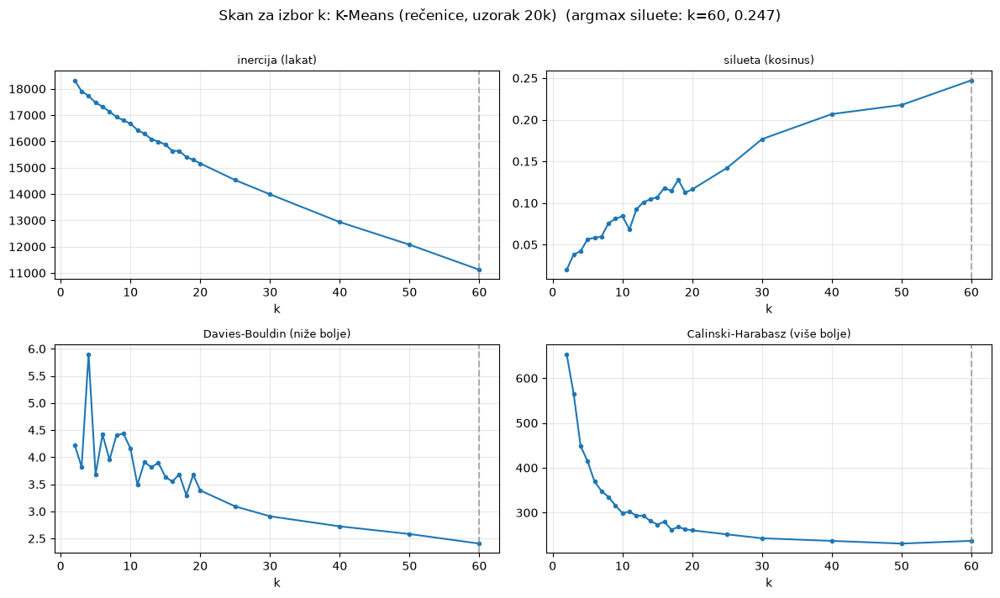

K-Means (rečenice, uzorak 20k): argmax siluete k=60 (0.2472957752411785)
[23:49:29] rečenice, skan: Bisecting K-Means ...
  [keš] param_choice_sbatt_bisecting_k-means.pkl učitan (obriši za ponovni račun)


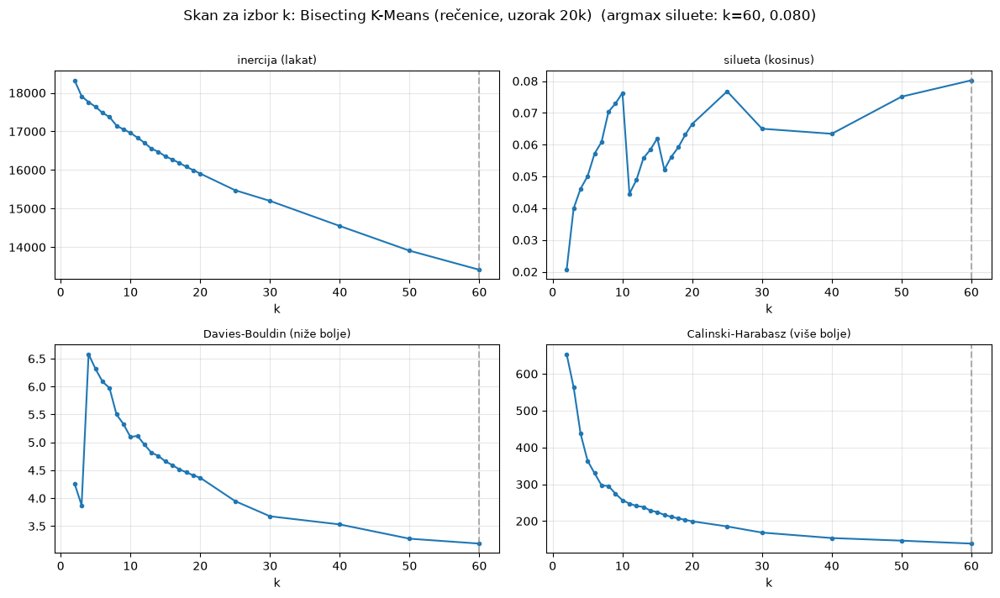

Bisecting K-Means (rečenice, uzorak 20k): argmax siluete k=60 (0.08024060303308217)
[23:55:05] rečenice, skan: GMM (diag) ...
  [keš] param_choice_sbatt_gmm_diag.pkl učitan (obriši za ponovni račun)


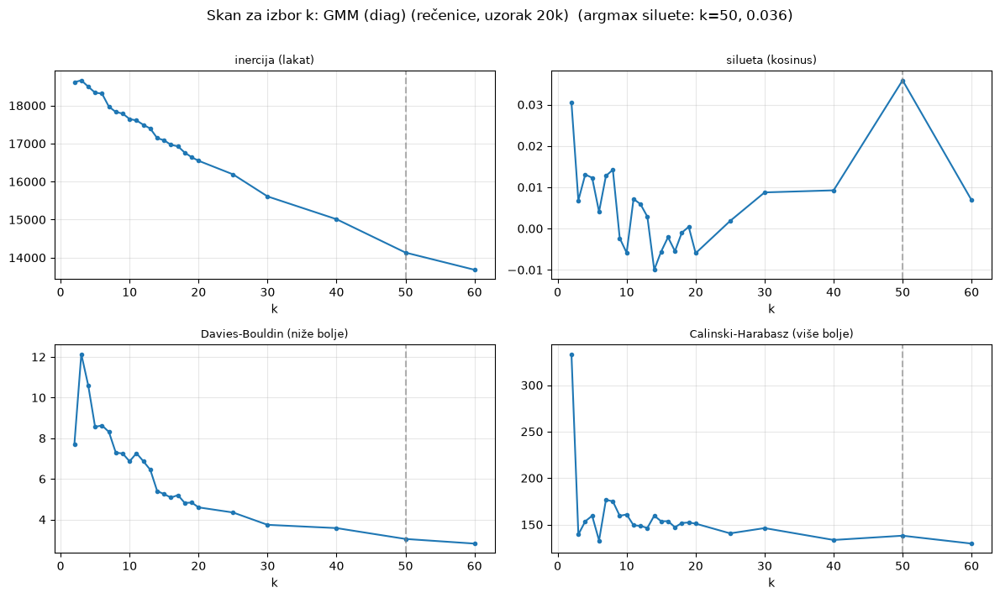

GMM (diag) (rečenice, uzorak 20k): argmax siluete k=50 (0.03587855786031184)
[00:00:47] rečenice, skan: BIRCH ...
  [keš] param_choice_sbatt_birch.pkl učitan (obriši za ponovni račun)


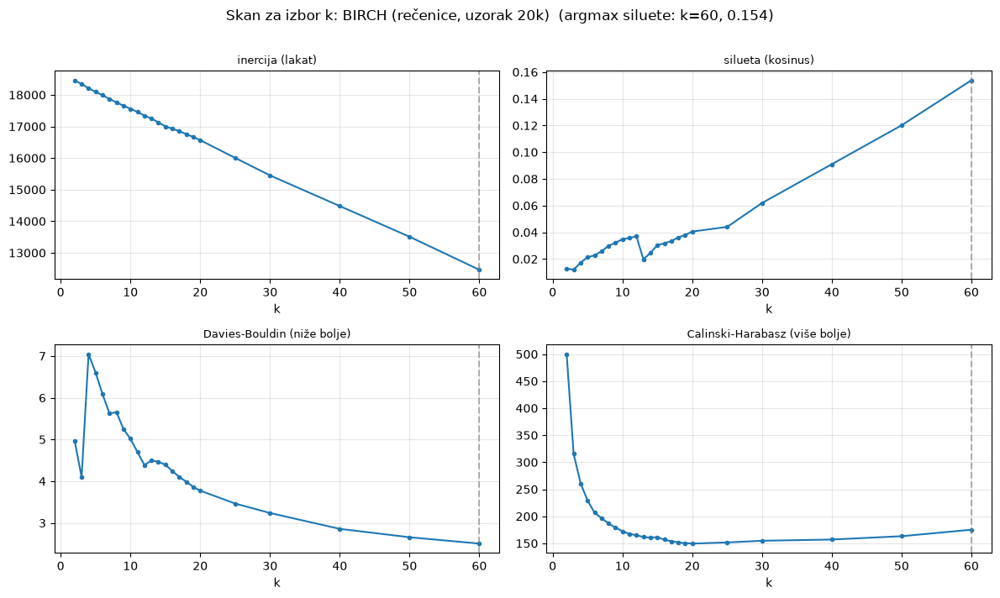

BIRCH (rečenice, uzorak 20k): argmax siluete k=60 (0.15380185319272624)
[00:06:38] rečenice, skan: NMF ...
  [keš] param_choice_sbatt_nmf.pkl učitan (obriši za ponovni račun)


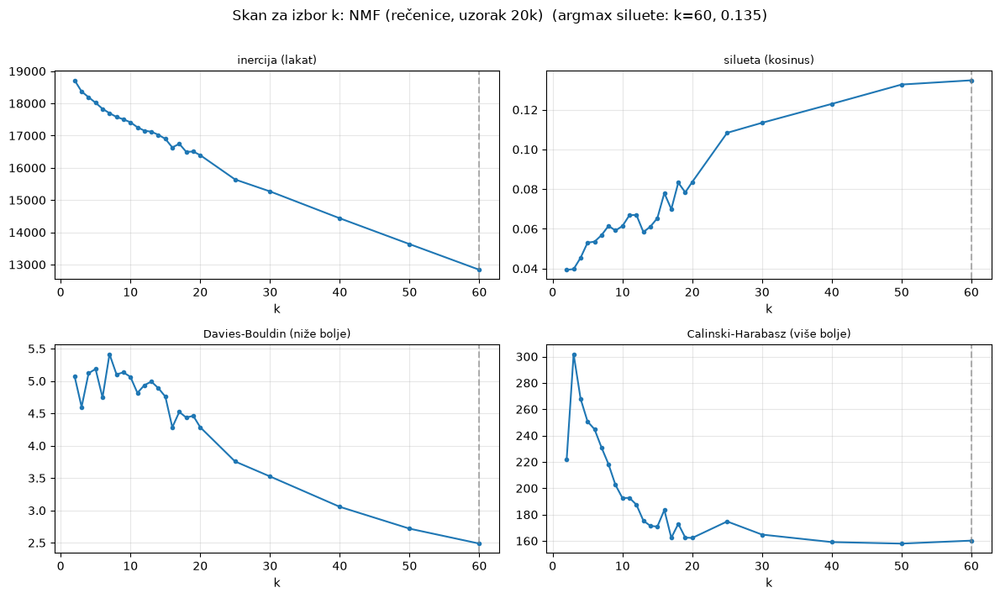

NMF (rečenice, uzorak 20k): argmax siluete k=60 (0.13480652221724976)


In [15]:
S = joblib.load("results/sent_features.pkl")
SENT_RED = joblib.load("results/sent_dim_scan.pkl")["red"]
sub = S["sample_idx"]
Xs = SENT_RED[sub]
Ys = S["Y"].astype(int)
Sd = dict(tfidf=S["sample"]["tfidf"], terms=S["sample"]["terms"],
          Y=Ys[sub], gmean=S["sample"]["gmean"])
emb_tsne_s = joblib.load("results/tsne_sent_sample.pkl")
emb2_s = Xs[:, :2]
_sd = joblib.load("results/sent_dim_scan.pkl")
SENT_EVR2 = _sd.get("evr2")
if SENT_EVR2 is None:
    _sv = TruncatedSVD(100, random_state=42).fit(S["tfidf"])
    SENT_EVR2 = float(_sv.explained_variance_ratio_[:2].sum())
print("uzorak:", Xs.shape, "| puni sloj:", SENT_RED.shape,
      "| 2D SVD varijansa:",
      f"{SENT_EVR2:.1%}" if SENT_EVR2 is not None else "n/a")


G_IDX, G_Y = S["g_idx"], S["g_y"].astype(int)


def _knn_labels():
    from sklearn.neighbors import NearestNeighbors
    nn = NearestNeighbors(n_neighbors=2).fit(SENT_RED[G_IDX])
    _, idx = nn.kneighbors(SENT_RED)
    nearest = idx[:, 0].copy()
    self_mask = nearest == np.arange(len(SENT_RED))
    nearest[self_mask] = idx[self_mask, 1]
    return G_Y[nearest].astype(np.int8), nearest


Yknn, _ = cached("param_choice_knn_labels.pkl", _knn_labels)

SGRID = list(range(2, 21)) + [25, 30, 40, 50, 60]

SENT_SKANS = {}
for name in ("K-Means", "Bisecting K-Means", "GMM (diag)",
             "BIRCH", "NMF"):
    log(f"rečenice, skan: {name} ...")
    labs = cached(f"param_choice_sbatt_{_safe_filename(name)}.pkl",
                  lambda n=name: fit_labels(n, Xs, Sd["tfidf"]))
    SENT_SKANS[name] = skan(
        f"{name} (rečenice, uzorak 20k)", labs, Xs,
        fname=f"sent_skan_{_safe_filename(name)}")

  [keš] param_choice_sbest_k.pkl učitan (obriši za ponovni račun)
najbolji k po silueti (rečenice): {'K-Means': 60, 'Bisecting K-Means': 60, 'GMM (diag)': 50, 'BIRCH': 60, 'NMF': 60}
  [keš] param_choice_sbestk_labels.pkl učitan (obriši za ponovni račun)
[00:13:46] rečenice K-Means: k=60, čist.(nasl.) 0.4037, čist.(1468) 0.3420, sil 0.23727425852110773
  [pkl] results\sent_bestk_k-means.pkl


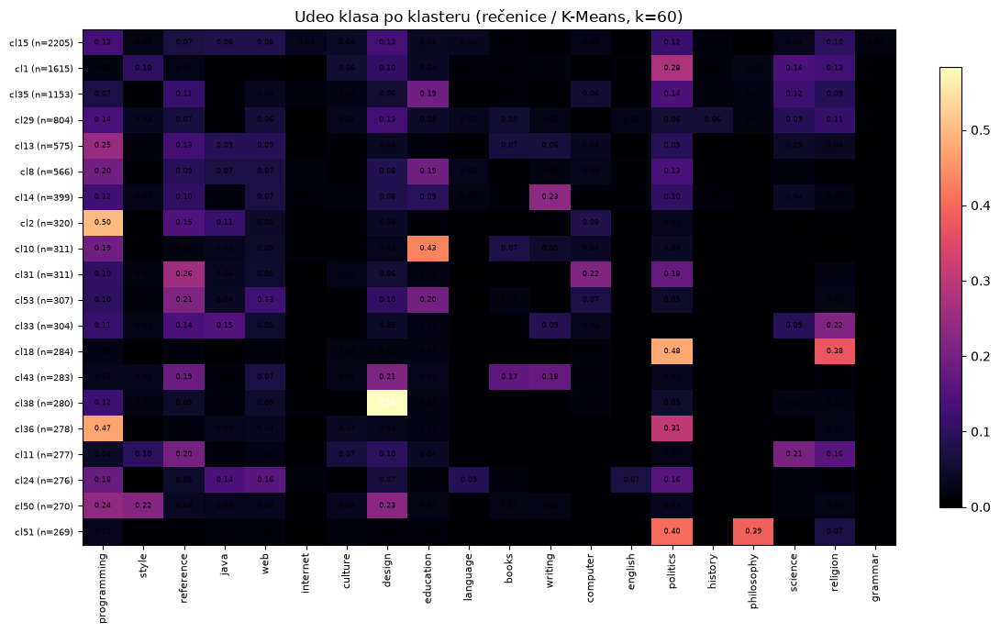

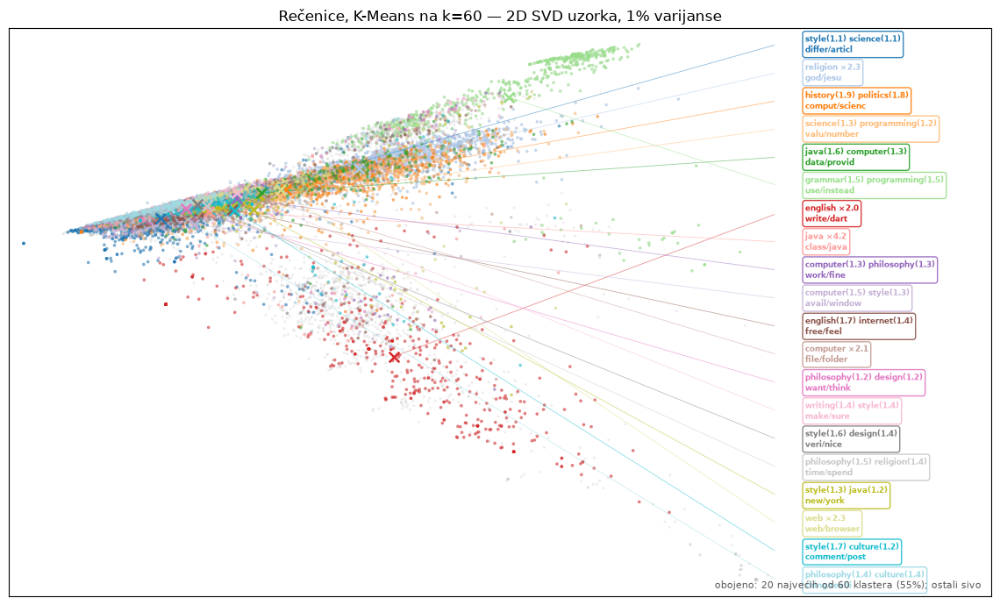

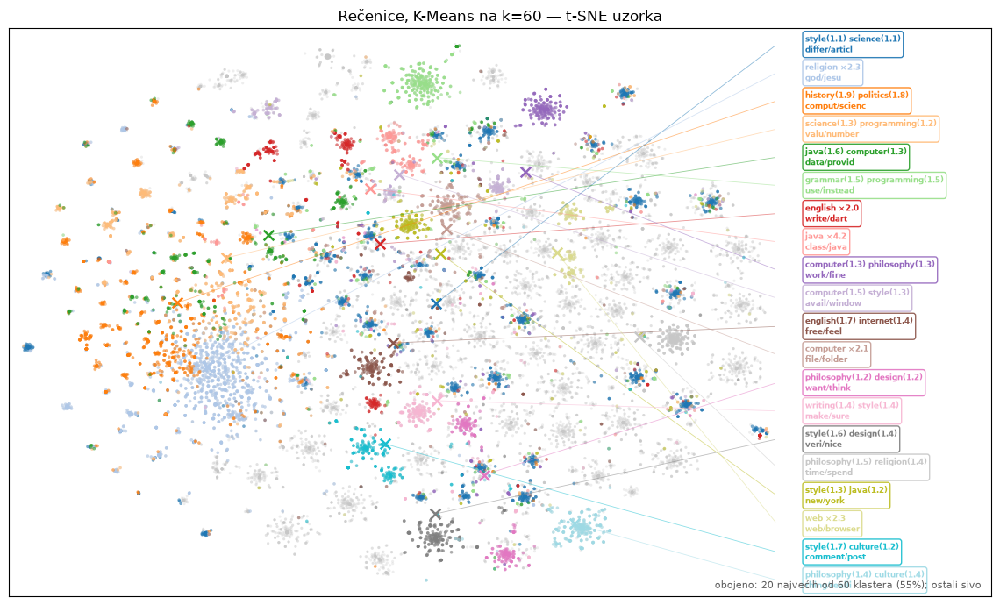

[00:14:38] rečenice Bisecting K-Means: k=60, čist.(nasl.) 0.3988, čist.(1468) 0.3283, sil 0.1120639257353016
  [pkl] results\sent_bestk_bisecting_k-means.pkl


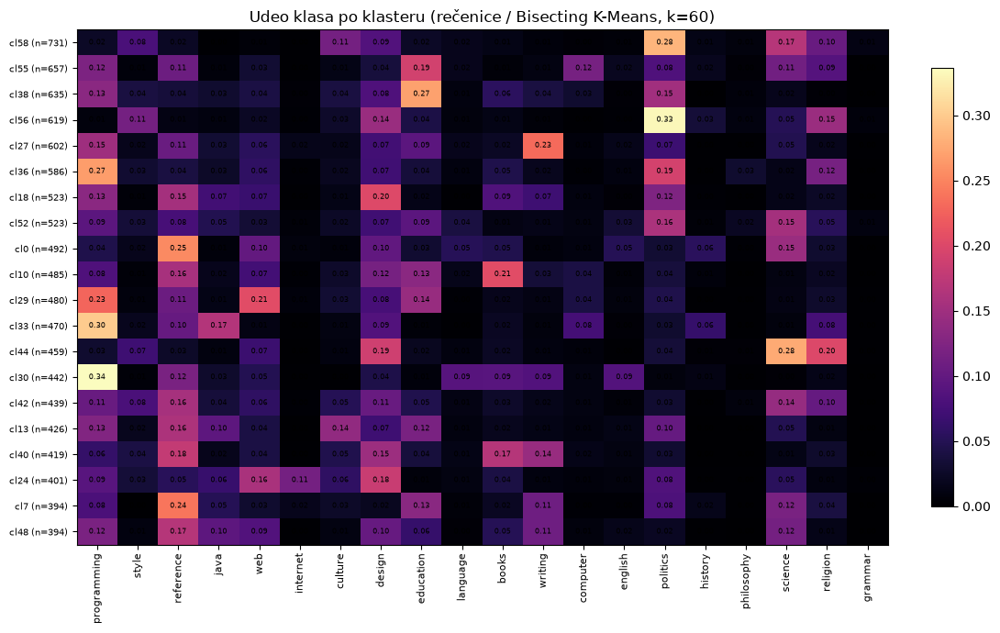

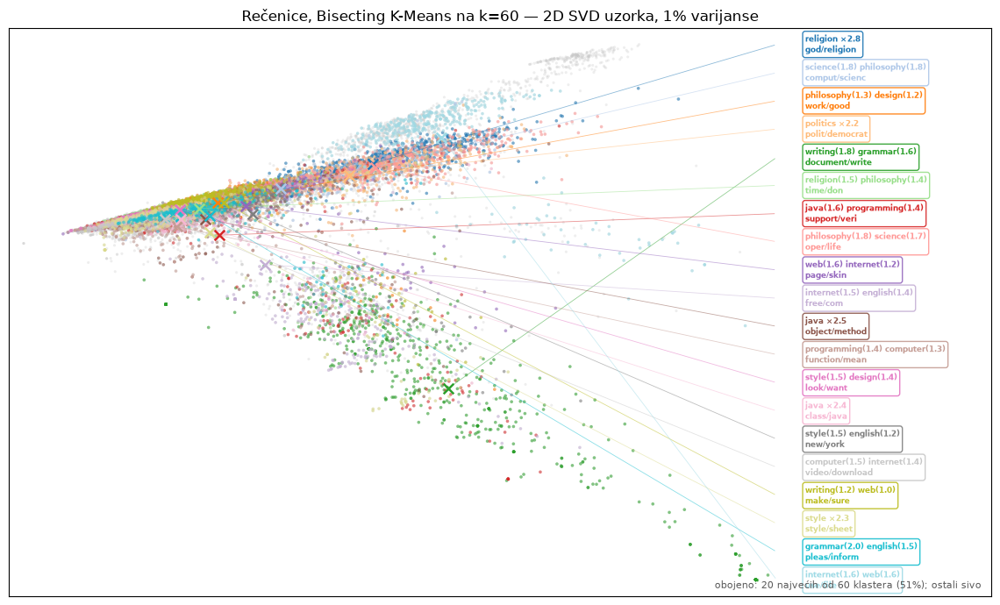

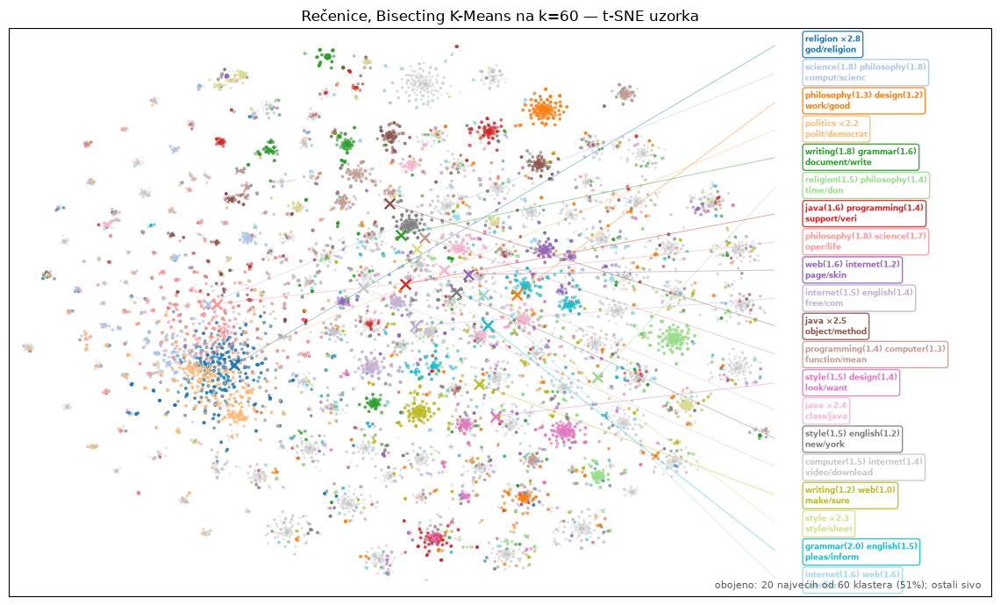

[00:15:21] rečenice GMM (diag): k=50, čist.(nasl.) 0.3905, čist.(1468) 0.2868, sil -0.04976934312447927
  [pkl] results\sent_bestk_gmm_diag.pkl


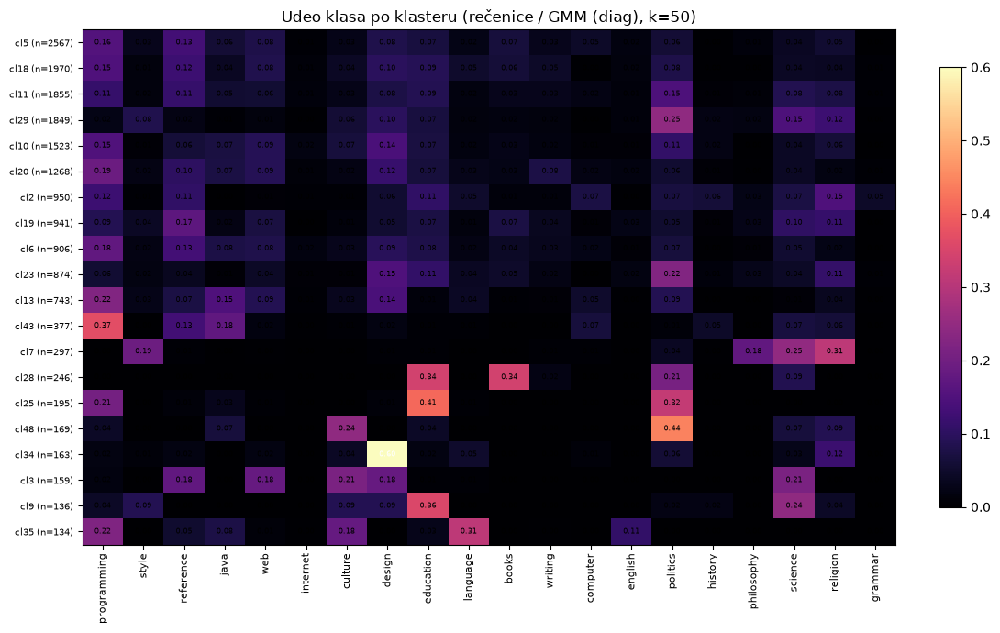

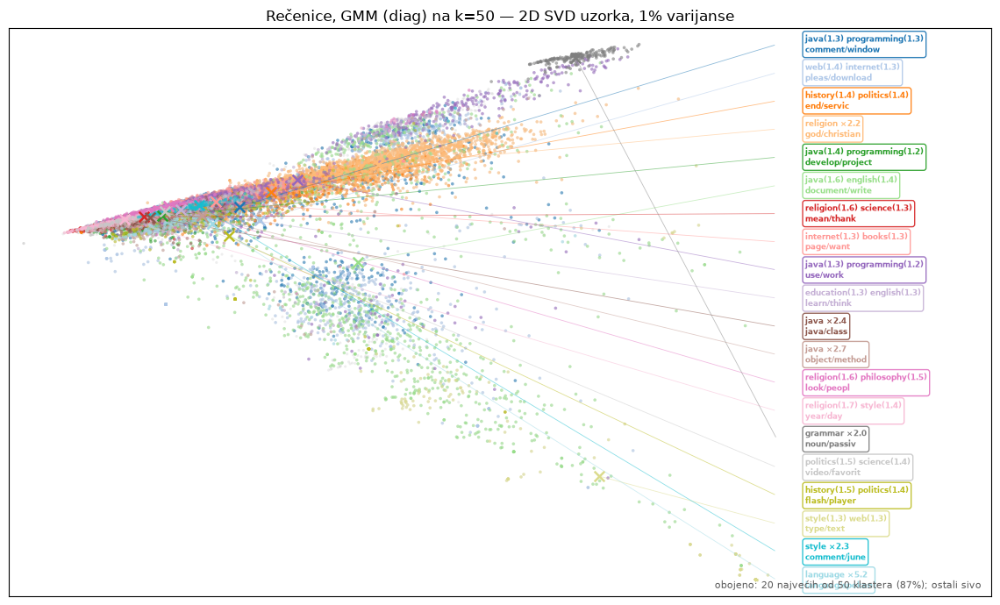

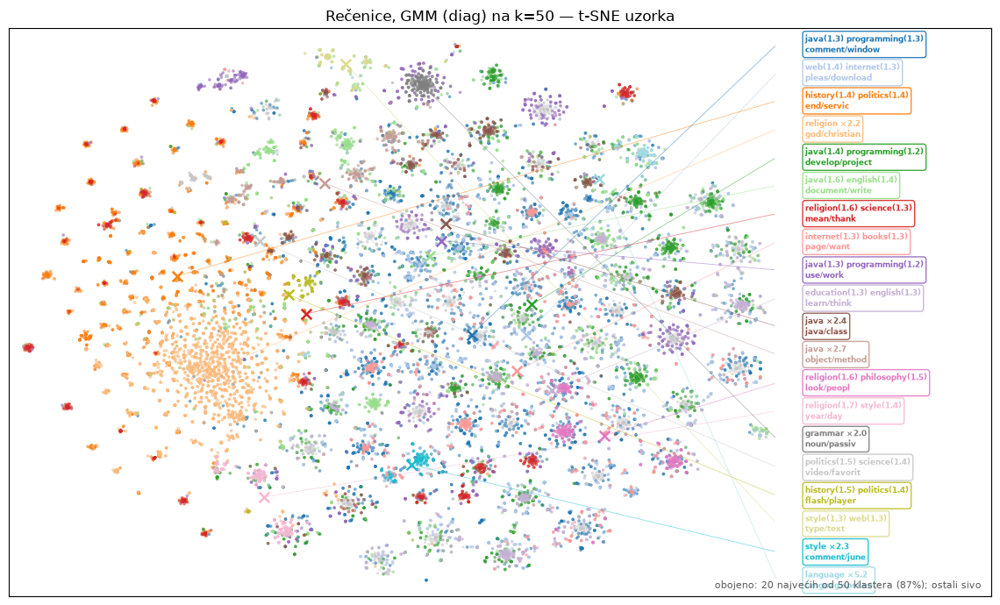

[00:15:59] rečenice BIRCH: k=60, čist.(nasl.) 0.4007, čist.(1468) 0.3304, sil 0.12398450137055116
  [pkl] results\sent_bestk_birch.pkl


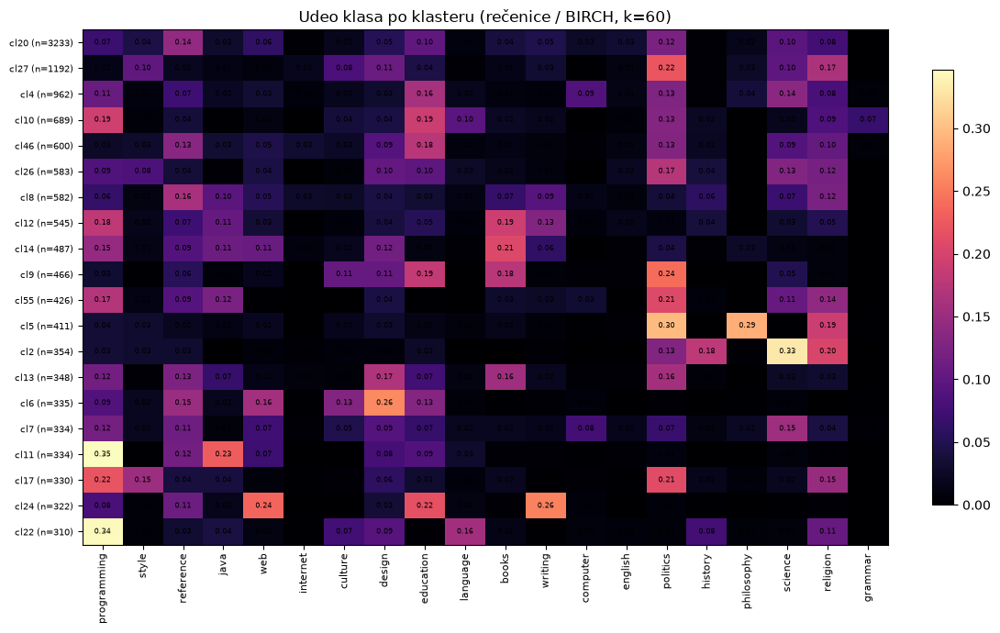

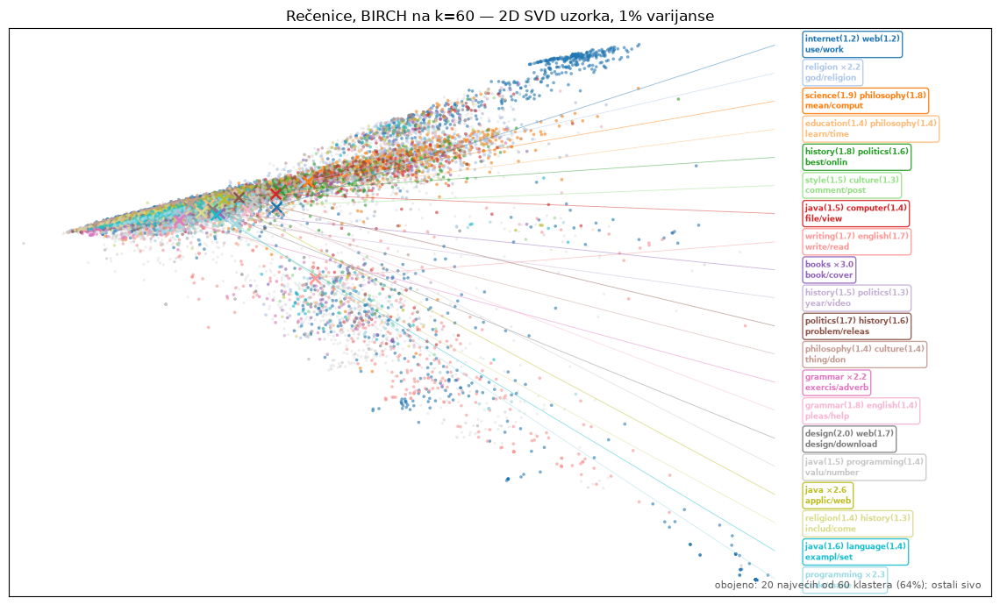

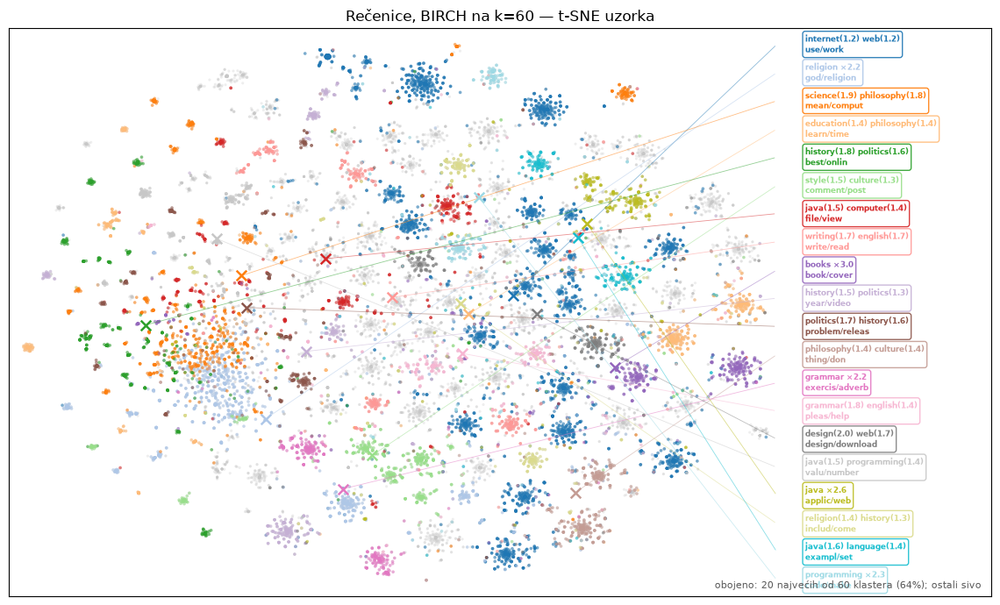

[00:16:33] rečenice NMF: k=60, čist.(nasl.) 0.3977, čist.(1468) 0.3488, sil 0.15750198003102686
  [pkl] results\sent_bestk_nmf.pkl


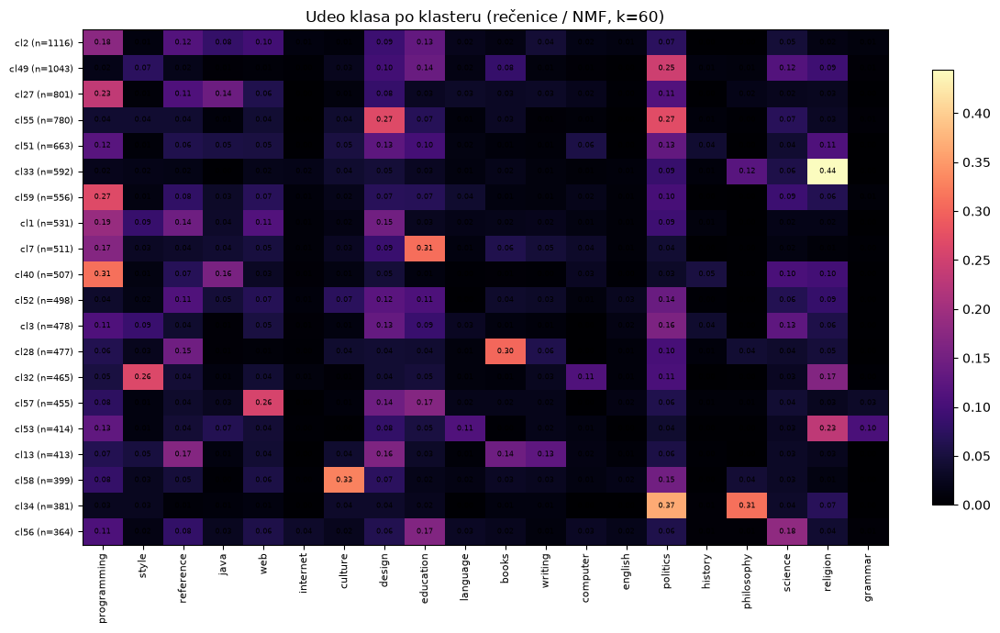

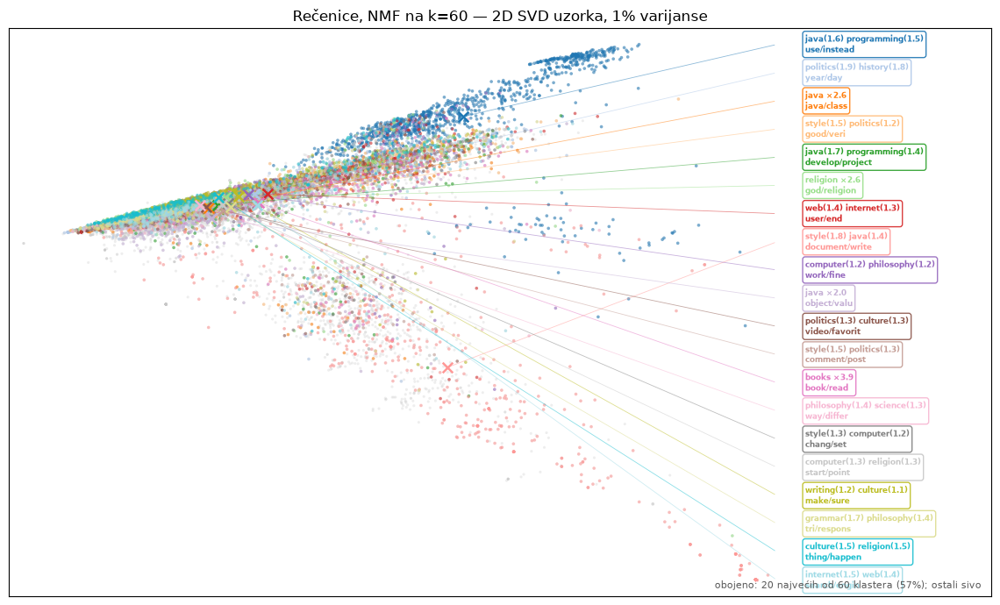

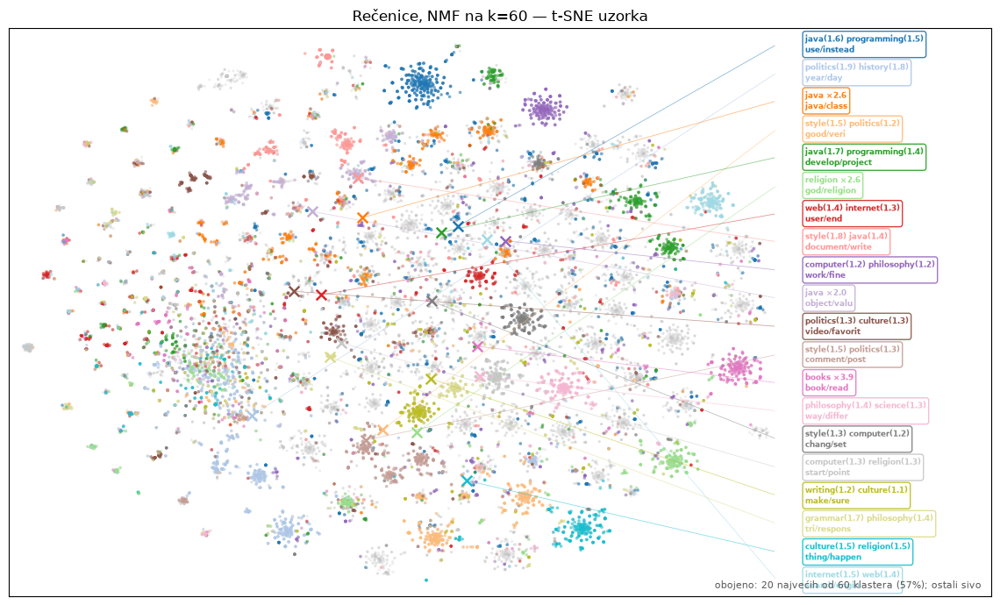

        algorithm  k_best  silhouette  purity_inherited  purity_true1468
          K-Means      60    0.237274            0.4037           0.3420
Bisecting K-Means      60    0.112064            0.3988           0.3283
       GMM (diag)      50   -0.049769            0.3905           0.2868
            BIRCH      60    0.123985            0.4007           0.3304
              NMF      60    0.157502            0.3977           0.3488


In [16]:
def _sbest_k():
    return {name: int(df.loc[df.sil.idxmax()].k)
            for name, df in SENT_SKANS.items()}

SBEST = cached("param_choice_sbest_k.pkl", _sbest_k)
print("najbolji k po silueti (rečenice):", SBEST)

def _sbestk_fits():
    out = {}
    for name, k in SBEST.items():
        if name == "K-Means":
            lab = KMeans(k, random_state=42, n_init=10) \
                .fit(SENT_RED).labels_
        elif name == "Bisecting K-Means":
            lab = BisectingKMeans(k, random_state=42) \
                .fit(SENT_RED).labels_
        elif name == "GMM (diag)":
            lab = GaussianMixture(
                k, covariance_type="diag", random_state=42
            ).fit(SENT_RED).predict(SENT_RED)
        elif name == "BIRCH":
            th, lab = fit_birch_guarded(SENT_RED, k)
            log(f"  [birch] čuva prag {th}")
        elif name == "NMF":
            lab = NMF(k, random_state=42, init="nndsvda",
                      max_iter=300).fit(S["tfidf"]) \
                .transform(S["tfidf"]).argmax(1)
        out[name] = (k, lab)
        log(f"  rečenice {name}: fit k={k}")
    return out

sfits = cached("param_choice_sbestk_labels.pkl", _sbestk_fits)
rows = []
g_idx, g_y = S["g_idx"], S["g_y"].astype(int)
for name, (k, lab) in sfits.items():
    m = internal_metrics(SENT_RED, lab)
    pur = multilabel_purity(lab, S["Y"].astype(int))
    pur_true = multilabel_purity(lab[g_idx], g_y)
    log(f"rečenice {name}: k={k}, čist.(nasl.) {pur:.4f}, "
        f"čist.(1468) {pur_true:.4f}, sil {m['silhouette']}")
    save_pkl(f"sent_bestk_{_safe_filename(name)}.pkl",
             dict(algorithm=name, k=k, labels=lab,
                  purity_inherited=round(pur, 4),
                  purity_true1468=round(pur_true, 4),
                  silhouette=m["silhouette"]))
    st = bestk_stamps(lab[sub], k, Sd)
    k20_class_heatmap(dict(Y=Yknn[sub]), np.asarray(lab[sub]),
                      level=f"re\u010denice / {name}", k_title=k,
                      fname=f"sent_bestk_{_safe_filename(name)}"
                            f"_heatmap.png",
                      top_clusters=20 if k > 20 else None)
    svar2 = (f", {SENT_EVR2:.0%} varijanse"
             if SENT_EVR2 is not None else "")
    for emb, tag, ttl in (
            (emb2_s, "svd2d", f"2D SVD uzorka{svar2}"),
            (emb_tsne_s, "tsne", "t-SNE uzorka")):
        cluster_scatter(
            emb, np.asarray(lab[sub]), st,
            f"sent_bestk_{_safe_filename(name)}_{tag}.png",
            f"Rečenice, {name} na k={k} — {ttl}",
            topn=20 if k > 20 else 12)
    rows.append(dict(algorithm=name, k_best=k,
                     silhouette=m["silhouette"],
                     purity_inherited=round(pur, 4),
                     purity_true1468=round(pur_true, 4)))
pd.DataFrame(rows).to_csv("csv/sent_bestk_table.csv", index=False)
print(pd.DataFrame(rows).to_string(index=False))

## 5. Oznake rečenica: nasleđe dokumenta naspram k-NN prenosa


In [17]:
from sklearn.neighbors import NearestNeighbors

def _knn_labels():
    nn = NearestNeighbors(n_neighbors=2).fit(SENT_RED[g_idx])
    _, idx = nn.kneighbors(SENT_RED)
    nearest = idx[:, 0].copy()
    self_mask = nearest == np.arange(len(SENT_RED))
    nearest[self_mask] = idx[self_mask, 1]
    Yk = g_y[nearest].astype(np.int8)
    return Yk, nearest

Yknn, nn_idx = cached("param_choice_knn_labels.pkl", _knn_labels)
print("kNN oznake:", Yknn.shape,
      "| prose\u010dan broj oznaka:", round(float(Yknn.sum(1).mean()), 2),
      "| bez ijedne:", int((Yknn.sum(1) == 0).sum()))

def _proxy_quality(pred, true):
    inter = (pred & true).sum(1)
    union = (pred | true).sum(1)
    return dict(
        hit=float((inter > 0).mean()),
        jaccard=float((inter / np.maximum(union, 1)).mean()))

Y_true = g_y.astype(bool)
Y_inh_sonda = S["Y"][g_idx].astype(bool)
Y_loo = Yknn[g_idx].astype(bool)
cal = pd.DataFrame([
    dict(izvor="nasle\u0111e dokumenta", **_proxy_quality(Y_inh_sonda, Y_true)),
    dict(izvor="k-NN (LOO, 1-NN)", **_proxy_quality(Y_loo, Y_true))])
cal.to_csv("csv/sent_label_calibration.csv", index=False)
print(cal.round(3).to_string(index=False))

Ys_full = S["Y"].astype(int)
rows = []
for pkl, layer in (("sent_algorithms_k40.pkl", "k=40"),
                   ("param_choice_sbestk_labels.pkl", "najbolji k")):
    d = joblib.load(os.path.join("results", pkl))
    if "labels_of" in d:
        labs = d["labels_of"].items()
    else:
        labs = ((n, v[1]) for n, v in d.items())
    for name, lab in labs:
        lab = np.asarray(lab)
        rows.append(dict(
            layer=layer, algorithm=name,
            pur_nasl=round(multilabel_purity(lab, Ys_full), 4),
            pur_knn=round(multilabel_purity(lab, Yknn), 4),
            pur_true=round(multilabel_purity(lab[g_idx], g_y), 4)))
kn = pd.DataFrame(rows)
kn.to_csv("csv/sent_purity_three_sources.csv", index=False)
print(kn.to_string(index=False))

def _dimscan_knn():
    rows = []
    reps = [("sirovi TF-IDF (L2)",
             normalize(Sd["tfidf"], norm="l2"))]
    for d in (25, 50, 100, 150):
        sv = TruncatedSVD(d, random_state=42).fit(Sd["tfidf"])
        reps.append((f"SVD({d})+L2",
                     normalize(sv.transform(Sd["tfidf"]), norm="l2")))
    for rname, R in reps:
        lab = KMeans(K_MAIN, random_state=42, n_init=10).fit(R).labels_
        rows.append(dict(
            reprezentacija=rname,
            pur_knn=round(multilabel_purity(lab, Yknn[sub]), 4),
            pur_nasl=round(multilabel_purity(lab, Ys_full[sub]), 4)))
    return rows

ds = cached("param_choice_dimscan_knn.pkl", _dimscan_knn)
print(pd.DataFrame(ds).to_string(index=False))

  [keš] param_choice_knn_labels.pkl učitan (obriši za ponovni račun)
kNN oznake: (223288, 20) | prosečan broj oznaka: 1.15 | bez ijedne: 59911
            izvor   hit  jaccard
nasleđe dokumenta 0.736    0.472
 k-NN (LOO, 1-NN) 0.736    0.736
     layer         algorithm  pur_nasl  pur_knn  pur_true
      k=40           K-Means    0.3940   0.2915    0.3093
      k=40 Bisecting K-Means    0.3939   0.2615    0.3140
      k=40               GMM    0.3873   0.2564    0.2738
      k=40             BIRCH    0.3937   0.2398    0.2888
      k=40               NMF    0.3885   0.2666    0.2956
najbolji k           K-Means    0.4037   0.3432    0.3420
najbolji k Bisecting K-Means    0.3988   0.2939    0.3283
najbolji k        GMM (diag)    0.3905   0.2623    0.2868
najbolji k             BIRCH    0.4007   0.2963    0.3304
najbolji k               NMF    0.3977   0.3171    0.3488
  [keš] param_choice_dimscan_knn.pkl učitan (obriši za ponovni račun)
    reprezentacija  pur_knn  pur_nasl
sirovi TF-ID

## 6. Revizija ne-k parametara

Svi ključni parametri osim k na k=20: init×n_init K-Means-a, strategija Bisectinga, kovarijansa GMM-a (BIC) + n_init, init NMF-a, min_samples DBSCAN-a (eps istim pravilom pokrivenosti), n_neighbors Spektralnog i branching_factor BIRCH-a; Wardova linkage familija dolazi iz `csv/linkage_check.csv`.

In [18]:
def parameter_audit(Fd):
    red, tfidf_, Y = Fd["red"], Fd["tfidf"], Fd["Y"]
    rows = []

    def rec(algorithm, param, value, labels, note=""):
        m = internal_metrics(red, labels)
        rows.append(dict(
            algorithm=algorithm, param=param, value=str(value),
            purity=round(multilabel_purity(labels, Y), 4),
            sil=round(m["silhouette"], 4),
            db=round(m["davies_bouldin"], 2),
            ch=round(m["calinski"], 1),
            n_clusters=m["n_clusters"],
            coverage=round(m["coverage"], 2), note=note))
        return rows[-1]

    def _scan():
        # --- K-Means: init × n_init ---
        for init in ("k-means++", "random"):
            for n_init in (4, 10, 20):
                km = KMeans(K_MAIN, random_state=42, init=init,
                            n_init=n_init).fit(red)
                rec("K-Means", "init×n_init", f"{init}/{n_init}",
                    km.labels_,
                    "default" if (init == "k-means++"
                                  and n_init == 10) else "")
        # --- Bisecting K-Means: strategija ---
        for strategy in ("biggest_inertia", "largest_cluster"):
            bkm = BisectingKMeans(K_MAIN, random_state=42,
                                  bisecting_strategy=strategy) \
                .fit(red)
            rec("Bisecting K-Means", "strategy", strategy,
                bkm.labels_, "default"
                if strategy == "biggest_inertia" else "")
        # --- GMM: kovarijansa (BIC) + n_init ---
        for cov in ("spherical", "diag", "tied", "full"):
            g = GaussianMixture(K_MAIN, covariance_type=cov,
                                random_state=42).fit(red)
            rec("GMM", "covariance(BIC)",
                f"{cov} BIC={g.bic(red):.0f}", g.predict(red),
                "selected by BIC" if cov == "diag" else "")
        for n_init in (1, 10):
            g = GaussianMixture(K_MAIN, covariance_type="diag",
                                random_state=42,
                                n_init=n_init).fit(red)
            rec("GMM (diag)", "n_init", n_init, g.predict(red),
                "default" if n_init == 1 else "")
        # --- NMF: init (frobenius) ---
        for init in ("nndsvda", "nndsvd", "random"):
            nm = NMF(K_MAIN, random_state=42, init=init,
                     max_iter=500).fit(tfidf_)
            rec("NMF", "init", init,
                nm.transform(tfidf_).argmax(1),
                "current choice" if init == "nndsvda" else "")
        # --- DBSCAN: min_samples (eps istim pravilom) ---
        for ms in (5, 10, 20, 30):
            best_eps, best_n = None, -1
            for eps in (0.6, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0, 1.1):
                lab = DBSCAN(eps=eps, min_samples=ms).fit_predict(red)
                n_c = len(set(lab.tolist()) - {-1})
                cov = float((lab != -1).mean())
                if cov >= 0.5 and n_c > best_n:
                    best_eps, best_n = eps, n_c
            if best_eps is None:
                best_eps = 1.1  # nijedan eps ne dostiže pokrivenost 0.5
            lab = DBSCAN(eps=best_eps, min_samples=ms) \
                .fit_predict(red)
            rec("DBSCAN", "min_samples(eps rule)",
                f"ms={ms}, eps={best_eps}", lab,
                "current choice" if ms == 10 else "")
        # --- Spectral: n_neighbors ---
        for nn in (10, 20, 30, 50):
            spec = SpectralClustering(
                K_MAIN, affinity="nearest_neighbors", n_neighbors=nn,
                random_state=42, n_jobs=-1).fit(red)
            rec("Spectral (k-NN)", "n_neighbors", nn, spec.labels_,
                "current choice" if nn == 30 else "")
        # --- BIRCH: branching_factor (prag ostaje 0.3) ---
        for bf in (25, 50, 100):
            birch = Birch(n_clusters=K_MAIN, threshold=0.3,
                          branching_factor=bf).fit(red)
            rec("BIRCH", "branching_factor", bf, birch.labels_,
                "default" if bf == 50 else "")
        return rows

    rows = cached("param_audit_scan.pkl", _scan)

    # Ward: linkage familija (csv/linkage_check.csv)
    if os.path.exists("csv/linkage_check.csv"):
        lc = pd.read_csv("csv/linkage_check.csv")
        for _, r in lc.iterrows():
            rows.append(dict(
                algorithm="Agglomerative",
                param="linkage(cut quality)",
                value=r["linkage"], purity=round(r["purity_k20"], 4),
                sil=round(r["sil_k20"], 4), db=np.nan, ch=np.nan,
                n_clusters=K_MAIN, coverage=1.0,
                note=("current choice" if r["linkage"] == "ward"
                      else f"cophenetic {r['cophenetic']:.2f}")))

    df = pd.DataFrame(rows)
    df.to_csv("csv/param_scan_documents.csv", index=False)
    print("\n--- Revizija ne-k parametara (k=20, dokumenti): "
          "čistoća + silueta + napomena izbora ---")
    with pd.option_context("display.width", 200):
        print(df.to_string(index=False))
    return df

param_audit_df = parameter_audit(F)

  [keš] param_audit_scan.pkl učitan (obriši za ponovni račun)

--- Revizija ne-k parametara (k=20, dokumenti): čistoća + silueta + napomena izbora ---
        algorithm                 param                  value  purity     sil   db    ch  n_clusters  coverage            note
          K-Means           init×n_init            k-means++/4  0.5218  0.0766 3.66 166.8          20      1.00                
          K-Means           init×n_init           k-means++/10  0.5218  0.0766 3.66 166.8          20      1.00         default
          K-Means           init×n_init           k-means++/20  0.5218  0.0766 3.66 166.8          20      1.00                
          K-Means           init×n_init               random/4  0.5265  0.0744 3.58 166.2          20      1.00                
          K-Means           init×n_init              random/10  0.5265  0.0744 3.58 166.2          20      1.00                
          K-Means           init×n_init              random/20  0.5265  0.0744 3.

## 7. Poređenje sirovog TF-IDF i SVD(100) prolaza

Sekcija čita csv-ove dva prolaza (csv/ = SVD(100)+L2, raw/csv/ = sirovi TF-IDF) i spaja ih u tabele poređenja; štampa šta fali.

Napomene:
- NMF je u oba prolaza na sirovom TF-IDF-u, pa se ne poredi
- BIRCH se ne računa u sirovom prolazu (memorija potklastera)
- silueta/DB/CH nisu uporedivi između prostora različitih dimenzionalnosti; porede se čistoća, pokrivenost, izabrani k i oblik krive skana


In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

if not (os.path.isdir("csv") and os.path.isdir("raw")):
    raise FileNotFoundError("Nije pronadjen put")

PASSES = [("SVD(100)", "."), ("raw TF-IDF", "raw")]

TABLES = {
    "algorithm_table":   ["{name}.csv"],
    "bestk_table":       ["csv/{name}.csv"],
    "nonk_param_best":   ["csv/{name}.csv"],
    "param_scan_documents": ["csv/{name}.csv"],
    "kscan_2_120":       ["csv/{name}.csv"],
    "sent_algorithm_table": ["csv/{name}.csv"],
    "sent_bestk_table":  ["csv/{name}.csv"],
}

def load(table_name):
    out, missing = {}, []
    for pass_name, prefix in PASSES:
        for pattern in TABLES[table_name]:
            path = os.path.join(prefix, pattern.format(name=table_name))
            if os.path.exists(path):
                out[pass_name] = pd.read_csv(path)
                break
        else:
            missing.append(pass_name)
    if missing:
        print(f"[{table_name}] nedostaje za: " + ", ".join(missing))
    return out

def combine(table_name):
    frames = load(table_name)
    if not frames:
        return None
    return pd.concat(
        [df.assign(space=pass_name) for pass_name, df in frames.items()],
        ignore_index=True)

def save(df, table_name):
    if df is not None:
        df.to_csv(f"csv/comparison_{table_name}.csv", index=False)
        print(f"-> csv/comparison_{table_name}.csv")

print("spremno")

### 7.1 Tabela algoritama na k=20 (dokumenti)

Čistoća i pokrivenost po algoritmu i prostoru; silueta samo kao informacija unutar svakog prostora.

In [ ]:
df = combine("algorithm_table")
if df is not None:
    df = df[~df.algorithm.str.contains("NMF")]  # ista reprezentacija u oba
    save(df, "algorithm_table_k20")
    pivot = df.pivot_table(index="algorithm", columns="space",
                           values=["purity", "coverage", "silhouette"])
    display(pivot.round(3))
    df["purity_delta"] = (df.groupby("algorithm").purity
                          .transform(lambda s: s.diff().iloc[-1]
                                     if len(s) > 1 else np.nan))
    fig, ax = plt.subplots(figsize=(10, 5))
    ordered = df[df.space == "SVD(100)"].sort_values("purity")
    y = np.arange(len(ordered))
    h = 0.38
    for pass_name, color in (("SVD(100)", "steelblue"),
                             ("raw TF-IDF", "darkorange")):
        current = df[df.space == pass_name].set_index("algorithm")
        values = ordered.algorithm.map(current.purity).to_numpy()
        ax.barh(y + (h/2 if pass_name == "SVD(100)" else -h/2), values,
                height=h, color=color, label=pass_name)
    ax.set_yticks(y); ax.set_yticklabels(ordered.algorithm)
    ax.set_xlabel("čistoća (k=20)")
    ax.set_title("k=20: čistoća po algoritmu, SVD(100) vs sirovi TF-IDF")
    ax.legend(); ax.grid(alpha=.3, axis="x")
    plt.tight_layout(); plt.show()

### 7.2 Najbolji k po algoritmu

Izbor k po silueti iz skanova sekcije 2; zanimljiv deo priče — sirovi prostor pomera izbor ka malim k.

In [ ]:
df = combine("bestk_table")
if df is not None:
    save(df, "bestk_table")
    display(df.round(4))
    if df.space.nunique() > 1:
        pivot = df.pivot_table(index="algorithm", columns="space",
                               values="k_best")
        display(pivot)
else:
    print("(nedostaju tabele sirovog prolaza)")

### 7.3 Ne-k parametri

Izbor parametara po algoritmu (BIC, eps, prag...) i revizija iz sekcije 6 — poklapaju li se izbori između prostora.

In [ ]:
df = combine("nonk_param_best")
if df is not None:
    save(df, "nonk_param_best")
    display(df.pivot_table(index=["algorithm", "parameter"],
                           columns="space", values="chosen",
                           aggfunc=lambda s: " / ".join(map(str, s))))
df2 = combine("param_scan_documents")
if df2 is not None:
    save(df2, "param_scan_documents")
    display(df2[df2.param.isin(["covariance(BIC)",
                                "min_samples(eps rule)",
                                "n_neighbors"])]
              [["space", "algorithm", "param", "value",
                "purity", "sil", "note"]]
              .sort_values(["param", "space"]).round(4))

### 7.4 Krive skana k=2..120 (K-Means)

Vrednosti siluete nisu uporedive između prostora — gleda se **oblik** krive i gde je argmax.

In [ ]:
df = combine("kscan_2_120")
if df is not None:
    save(df, "kscan_2_120")
    fig, axes = plt.subplots(1, 3, figsize=(15, 4))
    for pass_name, color in (("SVD(100)", "steelblue"), ("raw TF-IDF", "darkorange")):
        d = df[df.space == pass_name]
        axes[0].plot(d.k, d.silhouette, color=color, label=pass_name)
        axes[1].plot(d.k, d.db, color=color)
        axes[2].plot(d.k, d.ch, color=color)
        kbest = int(d.loc[d.silhouette.idxmax(), "k"])
        axes[0].axvline(kbest, color=color, ls=":", lw=1)
        print(f"{pass_name}: argmax siluete na k={kbest} "
              f"({d.silhouette.max():.4f})")
    for ax, (column, title) in zip(axes, [("silhouette", "silueta"),
                                          ("db", "Davies-Bouldin"),
                                          ("ch", "Calinski-Harabasz")]):
        ax.set_xlabel("k"); ax.set_title(title); ax.grid(alpha=.3)
    axes[0].legend()
    plt.tight_layout(); plt.show()

### 7.5 Rečenice (223k)

Čistoća na 1 468 anotiranih i nasleđena čistoća; BIRCH fali sa sirove strane, NMF je zajednička reprezentacija.

In [ ]:
df = combine("sent_algorithm_table")
if df is not None:
    df = df[~df.algorithm.str.contains("NMF")]
    save(df, "sent_algorithm_table")
    columns = [c for c in ("algorithm", "space", "coverage",
                           "purity_inherited", "capture_1468_true",
                           "silhouette", "n_clusters") if c in df]
    display(df[columns].round(3))
df2 = combine("sent_bestk_table")
if df2 is not None:
    save(df2, "sent_bestk_table")
    display(df2.round(4))

### 7.6 Spectral na malim k (2..4)

Provera da li mali k drže strukturu i kod Spektralne metode, u oba prostora. Poslednja kolona je slaganje particija dva prostora na istom k (ARI).

In [ ]:
if os.path.exists("csv/spectral_small_k.csv"):
    display(pd.read_csv("csv/spectral_small_k.csv"))
else:
    print("nedostaje csv/spectral_small_k.csv")